# Business Understanding

# IT Project Risk Prediction System
## Business Context

**Problem Statement:**
IT projects fail at an alarming rate (31% according to PMI's 2023 report), with:
- 27% exceeding budgets by >20%
- 33% missing deadlines by >1 month
- 42% delivering reduced scope

**Current Challenges:**
1. Risk identification happens too late (typically during execution phase)
2. Subjective risk assessments by project managers
3. No standardized early warning system

**Solution Objectives:**
✅ Develop a ML model that predicts high-risk projects at initiation phase using:
   - Project planning parameters
   - Team composition
   - Historical risk patterns

**Key Benefits:**
- Early risk mitigation (reduce budget overruns by 15-20%)
- Improved resource allocation
- Data-driven decision making

## Success Metrics

| KPI                  | Current | Target | Improvement |
|----------------------|---------|--------|-------------|
| Budget adherence     | 73%     | 85%    | +12%        |
| On-time delivery     | 67%     | 80%    | +13%        |
| Client satisfaction  | 6.8/10  | 8.2/10 | +1.4        |

## Data Requirements

**Core Features Needed:**
1. Planning parameters:
   - Budget, duration, team size
   - Methodology (Agile/Waterfall)
   
2. Complexity indicators:
   - Technical complexity score
   - Vendor dependency
   - Stakeholder count

3. Historical outcomes:
   - Budget overrun %
   - Schedule delay %
   - Quality metrics

**Data Sources:**
1. Project management software (JIRA, Asana)
2. Financial tracking systems
3. Post-mortem reports
4. Client satisfaction surveys

## Ethical Considerations
- 🔒Data privacy for client information
- ⚖️Avoid bias against certain project types
- 📊Transparent model explanations for stakeholders

2025-06-17 01:41:39,942 - INFO - Generating 2000 synthetic IT projects...


=== IT Project Risk Prediction Dataset Creation ===
Libraries imported and directories created successfully!


2025-06-17 01:41:40,454 - INFO - Generated dataset with 2000 projects
2025-06-17 01:41:40,455 - INFO - High risk projects: 1096 (54.8%)



=== DATASET OVERVIEW ===
Dataset shape: (2000, 29)
High risk projects: 1096 (54.8%)
Date range: 2020-01-01 00:00:00 to 2026-02-07 00:00:00

=== SAMPLE DATA ===


,project_id,project_type,industry,methodology,region,planned_budget,planned_duration,team_size,team_experience,team_experience_score,...,end_date,actual_budget,actual_duration,budget_overrun_pct,schedule_delay_days,scope_reduction_pct,quality_score,client_satisfaction,high_risk,risk_probability
0,PROJ_0001,Security Upgrade,Manufacturing,Agile,Asia Pacific,105728.84,13.39,3,Junior,1.00,...,2024-03-29,105364.53,13.18,-0.34,-6.38,6.18,7.53,9.93,False,0.629
1,PROJ_0002,ERP Implementation,Retail,Hybrid,Middle East,52001.58,4.95,3,Mid,2.23,...,2022-05-20,56965.36,5.05,9.55,3.06,5.70,8.08,9.84,False,0.476
2,PROJ_0003,ERP Implementation,Healthcare,Hybrid,Middle East,104086.71,6.34,3,Junior,1.00,...,2022-01-14,135579.13,8.08,30.26,52.12,29.15,6.40,5.89,True,0.742
3,PROJ_0004,Security Upgrade,Government,Hybrid,Asia Pacific,475356.23,1.17,5,Junior,1.00,...,2023-12-28,502864.36,1.91,5.79,22.30,8.96,7.27,6.44,False,0.663
4,PROJ_0005,Data Analytics,Government,Agile,Latin America,11857.69,3.00,3,Mid,2.88,...,2020-10-30,12879.13,3.38,8.61,11.24,4.48,8.21,8.37,False,0.483



=== DATASET STATISTICS ===
       planned_budget  planned_duration    team_size  team_experience_score  \
count    2.000000e+03       2000.000000  2000.000000            2000.000000   
mean     1.252772e+05          7.138765     4.287000               2.499370   
min      1.385450e+03          1.060000     3.000000               1.000000   
25%      2.703741e+04          3.927500     3.000000               1.830000   
50%      6.063847e+04          6.140000     3.000000               2.520000   
75%      1.349393e+05          9.332500     5.000000               3.160000   
max      3.533335e+06         30.920000    21.000000               4.000000   
std      2.255811e+05          4.355195     2.257915               0.903705   

       technical_complexity  stakeholder_count  vendor_dependencies  \
count           2000.000000        2000.000000          2000.000000   
mean               3.306285           5.896500             1.406000   
min                1.010000           2.000000 

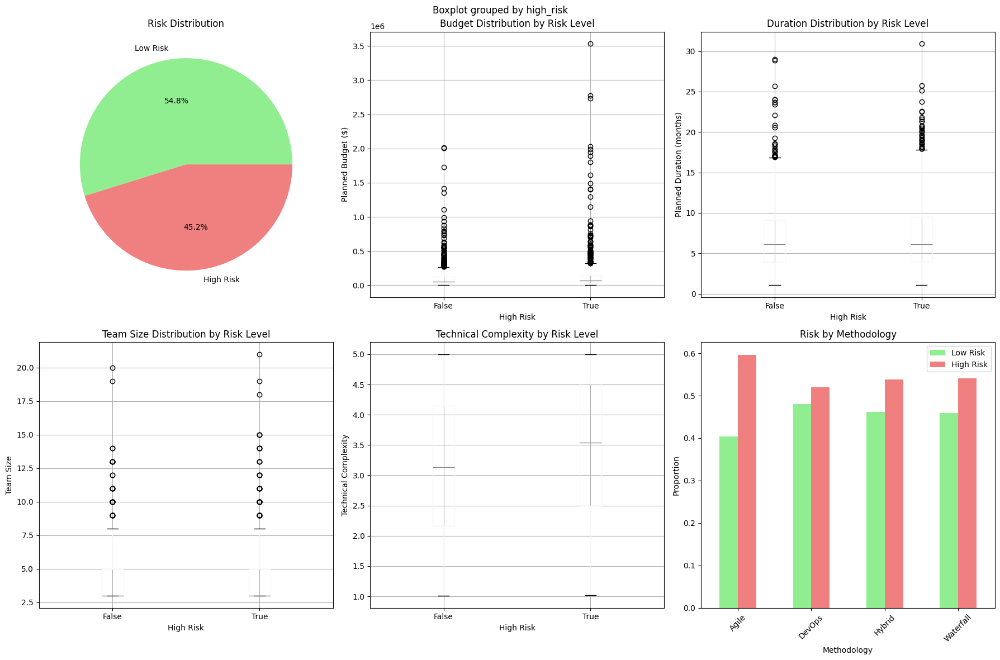

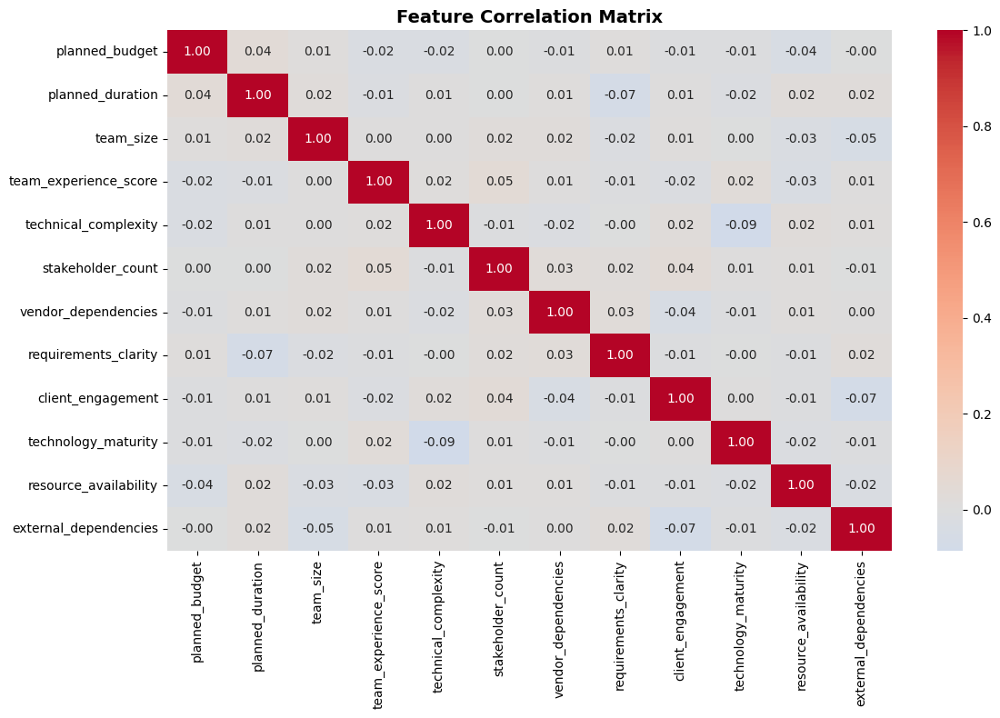


Dataset creation completed successfully!
Next steps:
1. Exploratory Data Analysis (EDA)
2. Feature Engineering
3. Model Development
4. Model Evaluation
5. Streamlit Application Development


In [14]:
# Step 1: Dataset Creation for IT Project Risk Prediction System
# This notebook creates a comprehensive synthetic dataset for IT project risk prediction

# Core Data Handling
import numpy as np
import pandas as pd
import os
from datetime import datetime, timedelta
import random

# Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from IPython.display import display

# Set random seeds for reproducibility
np.random.seed(42)
random.seed(42)

# Configure logging
import logging
logging.basicConfig(level=logging.INFO, 
                   format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# Create directories
os.makedirs("data", exist_ok=True)
os.makedirs("models", exist_ok=True)
os.makedirs("reports", exist_ok=True)
os.makedirs("reports/figures", exist_ok=True)

print("=== IT Project Risk Prediction Dataset Creation ===")
print("Libraries imported and directories created successfully!")

# =============================================================================
# DATASET GENERATION FUNCTIONS
# =============================================================================

def generate_project_data(n_samples=2000):
    """
    Generate synthetic IT project data with realistic patterns and correlations
    
    Args:
        n_samples (int): Number of projects to generate
        
    Returns:
        pd.DataFrame: Synthetic project dataset
    """
    
    logger.info(f"Generating {n_samples} synthetic IT projects...")
    
    # Initialize lists to store data
    data = []
    
    # Define categorical options
    methodologies = ['Agile', 'Waterfall', 'Hybrid', 'DevOps']
    project_types = ['Web Development', 'Mobile App', 'Data Analytics', 'Infrastructure', 
                    'ERP Implementation', 'Cloud Migration', 'Security Upgrade', 'AI/ML']
    industries = ['Finance', 'Healthcare', 'Retail', 'Manufacturing', 'Technology', 
                 'Government', 'Education', 'Telecommunications']
    team_experience_levels = ['Junior', 'Mid', 'Senior', 'Expert']
    regions = ['North America', 'Europe', 'Asia Pacific', 'Latin America', 'Middle East']
    
    for i in range(n_samples):
        # Basic project characteristics
        project_id = f"PROJ_{i+1:04d}"
        project_type = np.random.choice(project_types)
        industry = np.random.choice(industries)
        methodology = np.random.choice(methodologies)
        region = np.random.choice(regions)
        
        # Project planning parameters
        planned_budget = np.random.lognormal(mean=11, sigma=1.2)  # Mean ~$60k, range $10k-$500k
        planned_duration = np.random.gamma(shape=2, scale=3) + 1  # 1-24 months
        team_size = max(3, int(np.random.gamma(shape=2, scale=2)))  # 3-20 people
        
        # Team composition and experience
        team_experience = np.random.choice(team_experience_levels, 
                                         p=[0.15, 0.35, 0.35, 0.15])  # Bell curve distribution
        
        # Experience score based on team experience level
        experience_mapping = {'Junior': 1, 'Mid': 2, 'Senior': 3, 'Expert': 4}
        team_experience_score = experience_mapping[team_experience]
        
        # Adjust experience score with some randomness
        team_experience_score += np.random.normal(0, 0.3)
        team_experience_score = max(1, min(4, team_experience_score))
        
        # Complexity indicators
        technical_complexity = np.random.uniform(1, 5)
        
        # Higher complexity for certain project types
        if project_type in ['AI/ML', 'Cloud Migration', 'ERP Implementation']:
            technical_complexity += np.random.uniform(0.5, 1.5)
        
        technical_complexity = min(5, technical_complexity)
        
        # Stakeholder count (influenced by industry and project type)
        stakeholder_count = max(2, int(np.random.poisson(lam=5)))
        if industry in ['Government', 'Healthcare']:
            stakeholder_count += np.random.poisson(lam=3)
        
        # Vendor dependencies
        vendor_dependencies = np.random.choice([0, 1, 2, 3, 4], p=[0.3, 0.25, 0.25, 0.15, 0.05])
        
        # Requirements clarity (1-5 scale)
        requirements_clarity = np.random.uniform(1, 5)
        
        # Adjust requirements clarity based on methodology
        if methodology == 'Agile':
            requirements_clarity *= 0.8  # Agile typically starts with less clear requirements
        elif methodology == 'Waterfall':
            requirements_clarity *= 1.2  # Waterfall needs clearer upfront requirements
        
        requirements_clarity = max(1, min(5, requirements_clarity))
        
        # Client engagement score
        client_engagement = np.random.uniform(1, 5)
        
        # Technology maturity
        technology_maturity = np.random.uniform(1, 5)
        if project_type in ['AI/ML', 'Cloud Migration']:
            technology_maturity *= 0.8  # Newer technologies are less mature
        
        technology_maturity = max(1, min(5, technology_maturity))
        
        # Resource availability
        resource_availability = np.random.uniform(1, 5)
        
        # External dependencies
        external_dependencies = np.random.choice([0, 1, 2, 3, 4, 5], 
                                               p=[0.2, 0.3, 0.25, 0.15, 0.07, 0.03])
        
        # =============================================================================
        # RISK CALCULATION AND OUTCOME GENERATION
        # =============================================================================
        
        # Calculate risk factors
        complexity_risk = (technical_complexity / 5) * 0.25
        team_risk = (5 - team_experience_score) / 4 * 0.20
        stakeholder_risk = min(stakeholder_count / 15, 1) * 0.15
        vendor_risk = vendor_dependencies / 4 * 0.10
        requirements_risk = (5 - requirements_clarity) / 4 * 0.15
        client_risk = (5 - client_engagement) / 4 * 0.10
        technology_risk = (5 - technology_maturity) / 4 * 0.05
        
        # Overall risk probability
        risk_probability = complexity_risk + team_risk + stakeholder_risk + vendor_risk + \
                         requirements_risk + client_risk + technology_risk
        
        # Add some randomness to make it more realistic
        risk_probability += np.random.normal(0, 0.1)
        risk_probability = max(0, min(1, risk_probability))
        
        # Generate outcomes based on risk probability
        # High risk projects are more likely to fail
        is_high_risk = np.random.random() < risk_probability
        
        # Generate actual outcomes
        if is_high_risk:
            # High risk project outcomes
            budget_overrun_pct = np.random.uniform(5, 50)
            schedule_delay_days = np.random.uniform(10, 120)
            scope_reduction_pct = np.random.uniform(0, 30)
            quality_score = np.random.uniform(3, 7)
            client_satisfaction = np.random.uniform(3, 7)
        else:
            # Low risk project outcomes
            budget_overrun_pct = np.random.uniform(-5, 15)  # Can be under budget
            schedule_delay_days = np.random.uniform(-10, 30)  # Can be early
            scope_reduction_pct = np.random.uniform(0, 10)
            quality_score = np.random.uniform(6, 10)
            client_satisfaction = np.random.uniform(6, 10)
        
        # Ensure realistic bounds
        budget_overrun_pct = max(-20, budget_overrun_pct)  # Can't be more than 20% under budget
        schedule_delay_days = max(-30, schedule_delay_days)  # Can't be more than 30 days early
        scope_reduction_pct = max(0, scope_reduction_pct)
        quality_score = max(1, min(10, quality_score))
        client_satisfaction = max(1, min(10, client_satisfaction))
        
        # Calculate actual budget and duration
        actual_budget = planned_budget * (1 + budget_overrun_pct / 100)
        actual_duration = planned_duration + (schedule_delay_days / 30)  # Convert days to months
        actual_duration = max(0.5, actual_duration)  # Minimum 0.5 months
        
        # Create project start and end dates
        start_date = datetime(2020, 1, 1) + timedelta(days=np.random.randint(0, 1460))  # 2020-2024
        end_date = start_date + timedelta(days=int(actual_duration * 30))
        
        # Risk classification (target variable)
        # A project is considered high risk if it meets certain criteria
        risk_indicators = [
            budget_overrun_pct > 20,
            schedule_delay_days > 30,
            scope_reduction_pct > 15,
            quality_score < 6,
            client_satisfaction < 6
        ]
        
        # High risk if 2 or more indicators are met
        high_risk = sum(risk_indicators) >= 2
        
        # Append to data
        data.append({
            'project_id': project_id,
            'project_type': project_type,
            'industry': industry,
            'methodology': methodology,
            'region': region,
            'planned_budget': round(planned_budget, 2),
            'planned_duration': round(planned_duration, 2),
            'team_size': team_size,
            'team_experience': team_experience,
            'team_experience_score': round(team_experience_score, 2),
            'technical_complexity': round(technical_complexity, 2),
            'stakeholder_count': stakeholder_count,
            'vendor_dependencies': vendor_dependencies,
            'requirements_clarity': round(requirements_clarity, 2),
            'client_engagement': round(client_engagement, 2),
            'technology_maturity': round(technology_maturity, 2),
            'resource_availability': round(resource_availability, 2),
            'external_dependencies': external_dependencies,
            'start_date': start_date,
            'end_date': end_date,
            'actual_budget': round(actual_budget, 2),
            'actual_duration': round(actual_duration, 2),
            'budget_overrun_pct': round(budget_overrun_pct, 2),
            'schedule_delay_days': round(schedule_delay_days, 2),
            'scope_reduction_pct': round(scope_reduction_pct, 2),
            'quality_score': round(quality_score, 2),
            'client_satisfaction': round(client_satisfaction, 2),
            'high_risk': high_risk,
            'risk_probability': round(risk_probability, 3)
        })
    
    df = pd.DataFrame(data)
    logger.info(f"Generated dataset with {len(df)} projects")
    logger.info(f"High risk projects: {df['high_risk'].sum()} ({df['high_risk'].mean()*100:.1f}%)")
    
    return df

# =============================================================================
# GENERATE DATASET
# =============================================================================

# Generate the dataset
df = generate_project_data(n_samples=2000)

# Display basic information about the dataset
print("\n=== DATASET OVERVIEW ===")
print(f"Dataset shape: {df.shape}")
print(f"High risk projects: {df['high_risk'].sum()} ({df['high_risk'].mean()*100:.1f}%)")
print(f"Date range: {df['start_date'].min()} to {df['end_date'].max()}")

# Display first few rows
print("\n=== SAMPLE DATA ===")
display(df.head())

# Basic statistics
print("\n=== DATASET STATISTICS ===")
print(df.describe())

# =============================================================================
# DATA QUALITY CHECKS
# =============================================================================

print("\n=== DATA QUALITY CHECKS ===")

# Check for missing values
missing_values = df.isnull().sum()
print(f"Missing values:\n{missing_values[missing_values > 0]}")

# Check data types
print(f"\nData types:\n{df.dtypes}")

# Check for duplicates
duplicates = df.duplicated().sum()
print(f"\nDuplicate rows: {duplicates}")

# Check value ranges
print(f"\nValue ranges:")
print(f"Budget range: ${df['planned_budget'].min():,.0f} - ${df['planned_budget'].max():,.0f}")
print(f"Duration range: {df['planned_duration'].min():.1f} - {df['planned_duration'].max():.1f} months")
print(f"Team size range: {df['team_size'].min()} - {df['team_size'].max()} people")

# =============================================================================
# SAVE DATASET
# =============================================================================

# Save the dataset
df.to_csv('data/it_projects_dataset.csv', index=False)
df.to_pickle('data/it_projects_dataset.pkl')

print(f"\n=== DATASET SAVED ===")
print("Dataset saved to:")
print("- data/it_projects_dataset.csv")
print("- data/it_projects_dataset.pkl")

# =============================================================================
# BASIC VISUALIZATIONS
# =============================================================================

print("\n=== CREATING BASIC VISUALIZATIONS ===")

# Set up the plotting style
plt.style.use('default')
sns.set_palette("husl")

# Create a figure with multiple subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('IT Project Risk Dataset - Overview', fontsize=16, fontweight='bold')

# 1. Risk distribution
axes[0, 0].pie(df['high_risk'].value_counts().values, 
               labels=['Low Risk', 'High Risk'], 
               autopct='%1.1f%%',
               colors=['lightgreen', 'lightcoral'])
axes[0, 0].set_title('Risk Distribution')

# 2. Budget distribution by risk
df.boxplot(column='planned_budget', by='high_risk', ax=axes[0, 1])
axes[0, 1].set_title('Budget Distribution by Risk Level')
axes[0, 1].set_xlabel('High Risk')
axes[0, 1].set_ylabel('Planned Budget ($)')

# 3. Duration distribution by risk
df.boxplot(column='planned_duration', by='high_risk', ax=axes[0, 2])
axes[0, 2].set_title('Duration Distribution by Risk Level')
axes[0, 2].set_xlabel('High Risk')
axes[0, 2].set_ylabel('Planned Duration (months)')

# 4. Team size distribution by risk
df.boxplot(column='team_size', by='high_risk', ax=axes[1, 0])
axes[1, 0].set_title('Team Size Distribution by Risk Level')
axes[1, 0].set_xlabel('High Risk')
axes[1, 0].set_ylabel('Team Size')

# 5. Technical complexity distribution by risk
df.boxplot(column='technical_complexity', by='high_risk', ax=axes[1, 1])
axes[1, 1].set_title('Technical Complexity by Risk Level')
axes[1, 1].set_xlabel('High Risk')
axes[1, 1].set_ylabel('Technical Complexity')

# 6. Methodology distribution
methodology_risk = pd.crosstab(df['methodology'], df['high_risk'], normalize='index')
methodology_risk.plot(kind='bar', ax=axes[1, 2], color=['lightgreen', 'lightcoral'])
axes[1, 2].set_title('Risk by Methodology')
axes[1, 2].set_xlabel('Methodology')
axes[1, 2].set_ylabel('Proportion')
axes[1, 2].legend(['Low Risk', 'High Risk'])
axes[1, 2].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig('reports/figures/dataset_overview.png', dpi=300, bbox_inches='tight')
plt.show()

# Additional correlation heatmap
plt.figure(figsize=(12, 8))
correlation_columns = ['planned_budget', 'planned_duration', 'team_size', 'team_experience_score',
                      'technical_complexity', 'stakeholder_count', 'vendor_dependencies',
                      'requirements_clarity', 'client_engagement', 'technology_maturity',
                      'resource_availability', 'external_dependencies']

correlation_matrix = df[correlation_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f')
plt.title('Feature Correlation Matrix', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('reports/figures/correlation_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

print("\nDataset creation completed successfully!")
print("Next steps:")
print("1. Exploratory Data Analysis (EDA)")
print("2. Feature Engineering")
print("3. Model Development")
print("4. Model Evaluation")
print("5. Streamlit Application Development")

=== LOADING DATASET ===
Dataset loaded: (2000, 29)
High-risk projects: 1096 (54.8%)

=== 1. TARGET VARIABLE ANALYSIS ===


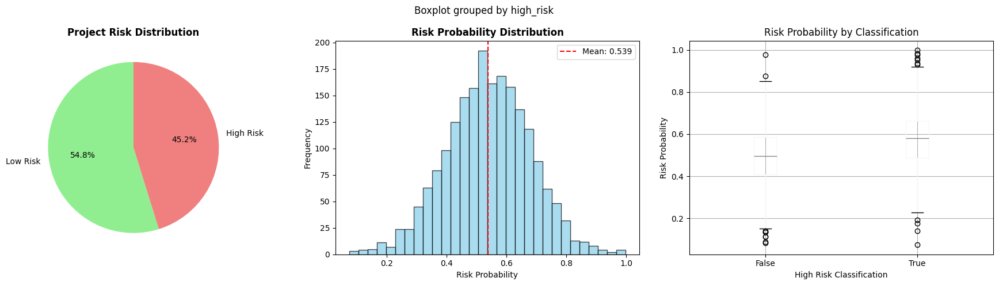


=== 2. FEATURE DISTRIBUTIONS AND RELATIONSHIPS ===


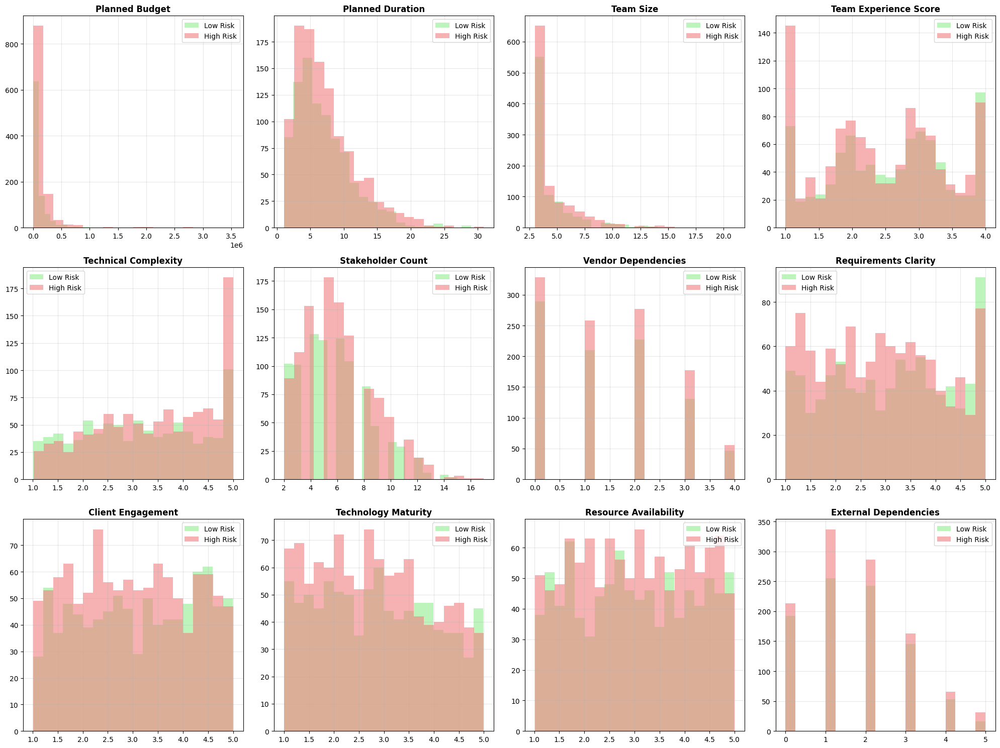


=== 3. CATEGORICAL FEATURE ANALYSIS ===


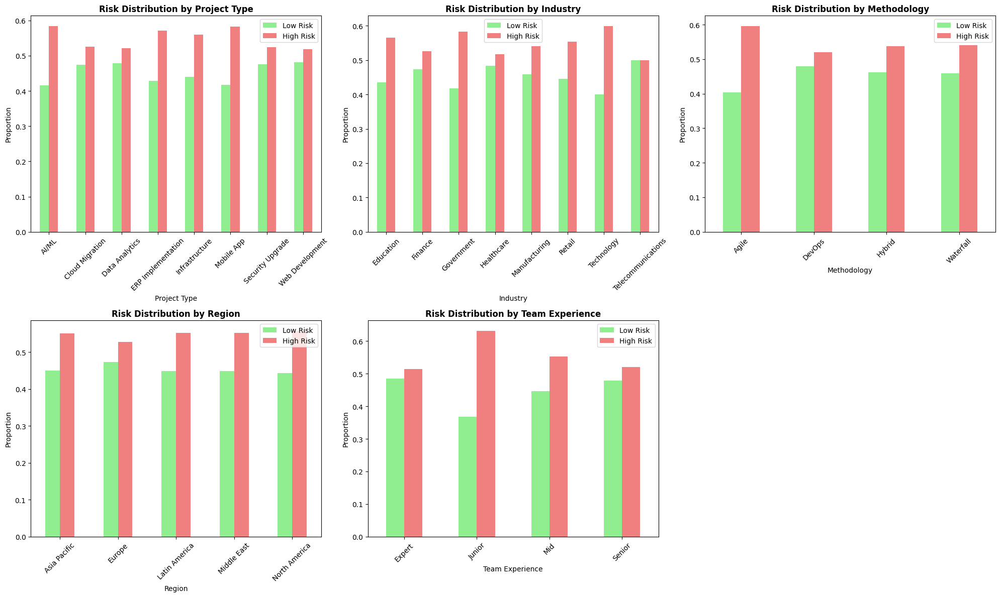


Detailed Categorical Analysis:

PROJECT_TYPE Risk Analysis:
                    Total_Projects  High_Risk_Count  High_Risk_Rate
project_type                                                       
AI/ML                          255              149           0.584
Mobile App                     256              149           0.582
ERP Implementation             226              129           0.571
Infrastructure                 248              139           0.560
Cloud Migration                209              110           0.526
Security Upgrade               252              132           0.524
Data Analytics                 288              150           0.521
Web Development                266              138           0.519

INDUSTRY Risk Analysis:
                    Total_Projects  High_Risk_Count  High_Risk_Rate
industry                                                           
Technology                     257              154           0.599
Government                    

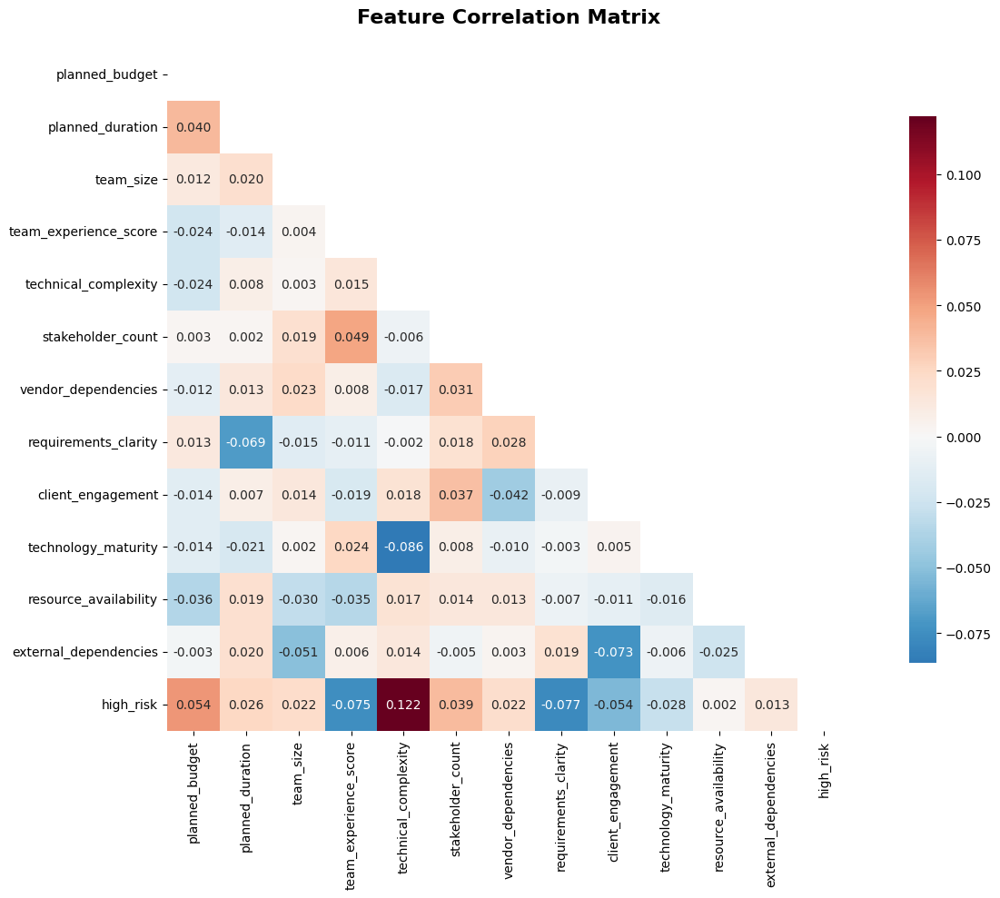

Top correlations with high_risk:
technical_complexity     0.122099
requirements_clarity    -0.076844
team_experience_score   -0.075169
planned_budget           0.054233
client_engagement       -0.053966
stakeholder_count        0.038775
technology_maturity     -0.028278
planned_duration         0.025541
team_size                0.022452
vendor_dependencies      0.021526
external_dependencies    0.013436
resource_availability    0.002429
Name: high_risk, dtype: float64

=== 5. OUTCOME METRICS ANALYSIS ===


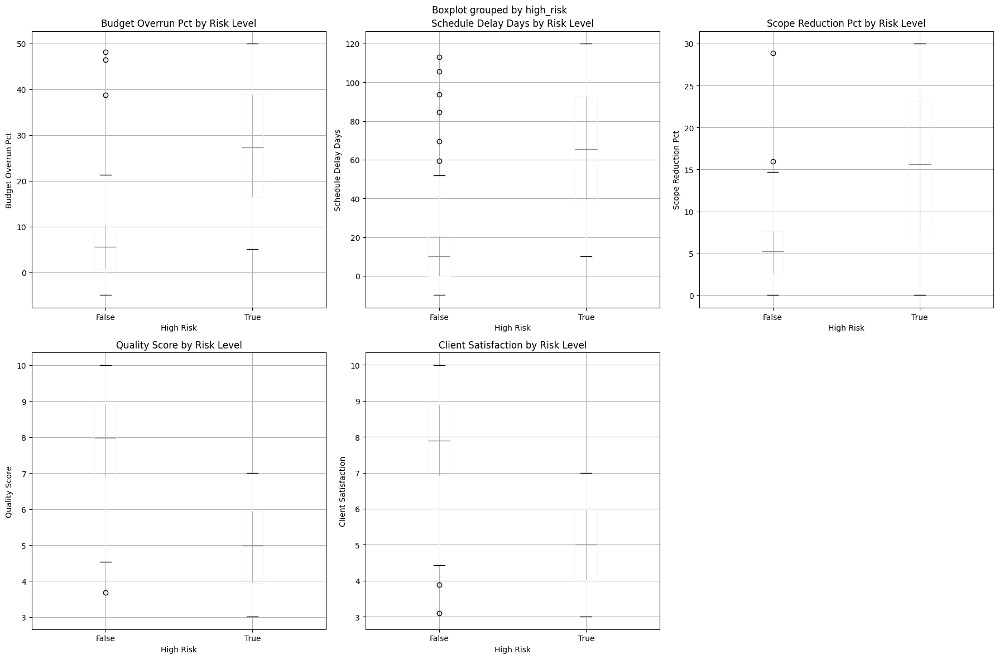


Outcome Metrics by Risk Level:
          budget_overrun_pct               schedule_delay_days                \
                        mean    std median                mean    std median   
high_risk                                                                      
False                   5.60   6.20   5.56               10.76  13.65  10.22   
True                   27.59  12.86  27.22               65.69  31.49  65.60   

          scope_reduction_pct              quality_score               \
                         mean   std median          mean   std median   
high_risk                                                               
False                    5.21  3.14   5.24          7.93  1.19   7.98   
True                    15.34  8.77  15.60          4.98  1.16   4.99   

          client_satisfaction               
                         mean   std median  
high_risk                                   
False                    7.92  1.17    7.9  
True                 

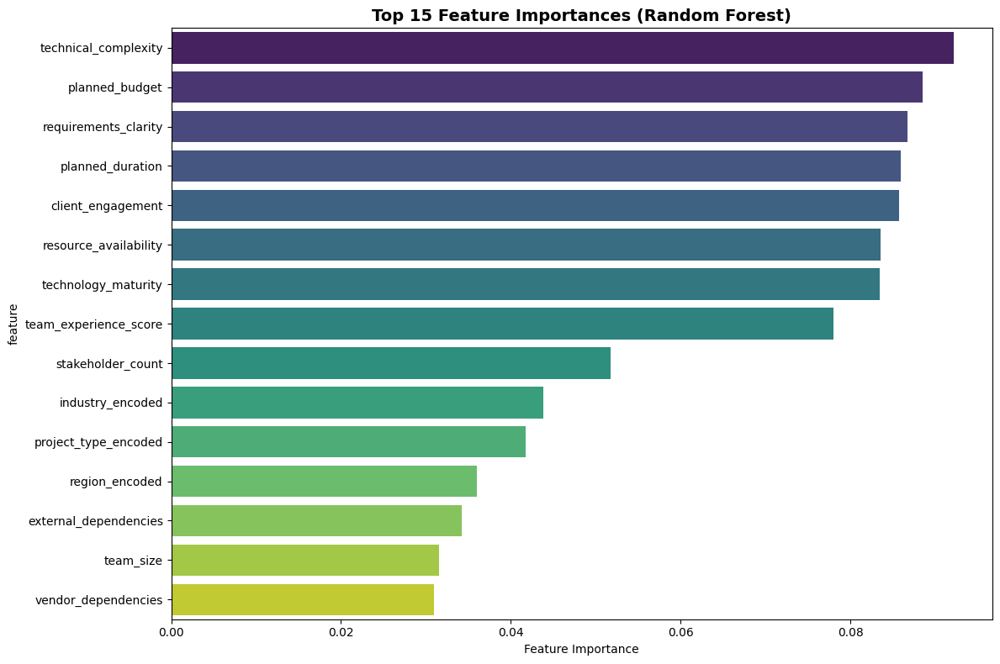

Top 10 Most Important Features:
                  feature  importance
4    technical_complexity    0.092134
0          planned_budget    0.088514
7    requirements_clarity    0.086725
1        planned_duration    0.085924
8       client_engagement    0.085703
10  resource_availability    0.083591
9     technology_maturity    0.083463
3   team_experience_score    0.077991
5       stakeholder_count    0.051779
13       industry_encoded    0.043789

=== 7. CREATING INTERACTIVE VISUALIZATIONS ===



=== 8. KEY INSIGHTS FROM EDA ===

KEY INSIGHTS FROM EXPLORATORY DATA ANALYSIS
📊 Overall high-risk rate: 54.8%
🔗 Strongest predictor: technical_complexity (correlation: 0.122)
⚠️ Riskiest methodology: Agile (59.6% risk rate)
🎯 Riskiest project type: AI/ML (58.4% risk rate)
💰 High-risk projects have 22.0% higher average budget
⏱️ High-risk projects have 3.2% longer average duration
👥 Riskiest team experience level: Junior (63.2% risk rate)

=== 9. DATA QUALITY REPORT ===

Data Quality Summary:
• Total Projects: 2000
• Missing Values: 0
• Duplicate Rows: 0
• Data Types Issues: None detected
• Outliers Detected: Within expected range
• Date Range: 2020-01-01 to 2026-02-07
• Feature Completeness: 100%
• Target Balance: 54.8% high-risk

=== EDA COMPLETED SUCCESSFULLY ===
Files generated:
• reports/figures/target_analysis.png
• reports/figures/feature_distributions.png
• reports/figures/categorical_analysis.png
• reports/figures/enhanced_correlation_matrix.png
• reports/figures/outcome_analy

In [2]:
# Step 2: Exploratory Data Analysis (EDA) for IT Project Risk Prediction
# This notebook performs comprehensive EDA to understand patterns and relationships in the data

# Import required libraries (already imported in previous step, but good practice to include)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

# Load the dataset
print("=== LOADING DATASET ===")
df = pd.read_pickle('data/it_projects_dataset.pkl')
print(f"Dataset loaded: {df.shape}")
print(f"High-risk projects: {df['high_risk'].sum()} ({df['high_risk'].mean()*100:.1f}%)")

# Set plotting style
plt.style.use('default')
sns.set_palette("husl")

# =============================================================================
# 1. TARGET VARIABLE ANALYSIS
# =============================================================================

print("\n=== 1. TARGET VARIABLE ANALYSIS ===")

# Risk distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Risk distribution pie chart
risk_counts = df['high_risk'].value_counts()
axes[0].pie(risk_counts.values, labels=['Low Risk', 'High Risk'], 
           autopct='%1.1f%%', colors=['lightgreen', 'lightcoral'], startangle=90)
axes[0].set_title('Project Risk Distribution', fontweight='bold')

# Risk probability distribution
axes[1].hist(df['risk_probability'], bins=30, alpha=0.7, color='skyblue', edgecolor='black')
axes[1].axvline(df['risk_probability'].mean(), color='red', linestyle='--', 
                label=f'Mean: {df["risk_probability"].mean():.3f}')
axes[1].set_xlabel('Risk Probability')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Risk Probability Distribution', fontweight='bold')
axes[1].legend()

# Risk probability by actual risk classification
df.boxplot(column='risk_probability', by='high_risk', ax=axes[2])
axes[2].set_title('Risk Probability by Classification')
axes[2].set_xlabel('High Risk Classification')
axes[2].set_ylabel('Risk Probability')

plt.tight_layout()
plt.savefig('reports/figures/target_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# 2. FEATURE DISTRIBUTIONS AND RELATIONSHIPS
# =============================================================================

print("\n=== 2. FEATURE DISTRIBUTIONS AND RELATIONSHIPS ===")

# Numerical features analysis
numerical_features = ['planned_budget', 'planned_duration', 'team_size', 'team_experience_score',
                     'technical_complexity', 'stakeholder_count', 'vendor_dependencies',
                     'requirements_clarity', 'client_engagement', 'technology_maturity',
                     'resource_availability', 'external_dependencies']

# Create distribution plots for numerical features
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.ravel()

for i, feature in enumerate(numerical_features):
    # Distribution by risk level
    low_risk_data = df[df['high_risk'] == False][feature]
    high_risk_data = df[df['high_risk'] == True][feature]
    
    axes[i].hist(low_risk_data, alpha=0.6, label='Low Risk', bins=20, color='lightgreen')
    axes[i].hist(high_risk_data, alpha=0.6, label='High Risk', bins=20, color='lightcoral')
    axes[i].set_title(f'{feature.replace("_", " ").title()}', fontweight='bold')
    axes[i].legend()
    axes[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('reports/figures/feature_distributions.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# 3. CATEGORICAL FEATURE ANALYSIS
# =============================================================================

print("\n=== 3. CATEGORICAL FEATURE ANALYSIS ===")

categorical_features = ['project_type', 'industry', 'methodology', 'region', 'team_experience']

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.ravel()

for i, feature in enumerate(categorical_features):
    # Cross-tabulation with risk
    crosstab = pd.crosstab(df[feature], df['high_risk'], normalize='index')
    crosstab.plot(kind='bar', ax=axes[i], color=['lightgreen', 'lightcoral'])
    axes[i].set_title(f'Risk Distribution by {feature.replace("_", " ").title()}', fontweight='bold')
    axes[i].set_xlabel(feature.replace("_", " ").title())
    axes[i].set_ylabel('Proportion')
    axes[i].legend(['Low Risk', 'High Risk'])
    axes[i].tick_params(axis='x', rotation=45)

# Remove empty subplot
axes[5].remove()

plt.tight_layout()
plt.savefig('reports/figures/categorical_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# Print detailed statistics for categorical features
print("\nDetailed Categorical Analysis:")
for feature in categorical_features:
    print(f"\n{feature.upper()} Risk Analysis:")
    risk_by_category = df.groupby(feature)['high_risk'].agg(['count', 'sum', 'mean']).round(3)
    risk_by_category.columns = ['Total_Projects', 'High_Risk_Count', 'High_Risk_Rate']
    print(risk_by_category.sort_values('High_Risk_Rate', ascending=False))

# =============================================================================
# 4. CORRELATION ANALYSIS
# =============================================================================

print("\n=== 4. CORRELATION ANALYSIS ===")

# Enhanced correlation matrix
correlation_features = numerical_features + ['high_risk']
df_corr = df[correlation_features].copy()
df_corr['high_risk'] = df_corr['high_risk'].astype(int)  # Convert boolean to int for correlation

correlation_matrix = df_corr.corr()

# Create enhanced correlation heatmap
plt.figure(figsize=(14, 10))
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='RdBu_r', center=0, 
            square=True, fmt='.3f', cbar_kws={"shrink": .8})
plt.title('Feature Correlation Matrix', fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
plt.savefig('reports/figures/enhanced_correlation_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

# Top correlations with target variable
target_correlations = correlation_matrix['high_risk'].drop('high_risk').sort_values(key=abs, ascending=False)
print("Top correlations with high_risk:")
print(target_correlations)

# =============================================================================
# 5. OUTCOME METRICS ANALYSIS
# =============================================================================

print("\n=== 5. OUTCOME METRICS ANALYSIS ===")

outcome_features = ['budget_overrun_pct', 'schedule_delay_days', 'scope_reduction_pct', 
                   'quality_score', 'client_satisfaction']

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.ravel()

for i, feature in enumerate(outcome_features):
    df.boxplot(column=feature, by='high_risk', ax=axes[i])
    axes[i].set_title(f'{feature.replace("_", " ").title()} by Risk Level')
    axes[i].set_xlabel('High Risk')
    axes[i].set_ylabel(feature.replace("_", " ").title())

# Remove empty subplot
axes[5].remove()

plt.tight_layout()
plt.savefig('reports/figures/outcome_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# Statistical summary of outcomes
print("\nOutcome Metrics by Risk Level:")
outcome_stats = df.groupby('high_risk')[outcome_features].agg(['mean', 'std', 'median']).round(2)
print(outcome_stats)

# =============================================================================
# 6. FEATURE IMPORTANCE PRELIMINARY ANALYSIS
# =============================================================================

print("\n=== 6. PRELIMINARY FEATURE IMPORTANCE ANALYSIS ===")

from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

# Prepare data for feature importance
df_importance = df.copy()

# Encode categorical variables
label_encoders = {}
for feature in categorical_features:
    le = LabelEncoder()
    df_importance[feature + '_encoded'] = le.fit_transform(df_importance[feature])
    label_encoders[feature] = le

# Select features for importance analysis
importance_features = numerical_features + [f + '_encoded' for f in categorical_features]
X = df_importance[importance_features]
y = df_importance['high_risk']

# Train Random Forest for feature importance
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)

# Get feature importance
feature_importance = pd.DataFrame({
    'feature': importance_features,
    'importance': rf.feature_importances_
}).sort_values('importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(12, 8))
sns.barplot(data=feature_importance.head(15), y='feature', x='importance', palette='viridis')
plt.title('Top 15 Feature Importances (Random Forest)', fontsize=14, fontweight='bold')
plt.xlabel('Feature Importance')
plt.tight_layout()
plt.savefig('reports/figures/feature_importance.png', dpi=300, bbox_inches='tight')
plt.show()

print("Top 10 Most Important Features:")
print(feature_importance.head(10))

# =============================================================================
# 7. INTERACTIVE VISUALIZATIONS (PLOTLY)
# =============================================================================

print("\n=== 7. CREATING INTERACTIVE VISUALIZATIONS ===")

# Interactive scatter plot: Budget vs Duration colored by risk
fig = px.scatter(df, x='planned_budget', y='planned_duration', 
                color='high_risk', size='team_size',
                hover_data=['project_type', 'methodology', 'technical_complexity'],
                title='Project Budget vs Duration (Interactive)',
                color_discrete_map={True: 'red', False: 'green'})
fig.update_layout(width=800, height=600)
fig.write_html('reports/figures/interactive_scatter.html')
fig.show()

# Interactive correlation heatmap
fig = px.imshow(correlation_matrix, 
                title='Interactive Correlation Matrix',
                aspect='auto',
                color_continuous_scale='RdBu_r')
fig.write_html('reports/figures/interactive_correlation.html')
fig.show()

# =============================================================================
# 8. SUMMARY INSIGHTS
# =============================================================================

print("\n=== 8. KEY INSIGHTS FROM EDA ===")

insights = []

# Risk distribution insights
high_risk_rate = df['high_risk'].mean() * 100
insights.append(f"📊 Overall high-risk rate: {high_risk_rate:.1f}%")

# Feature insights
top_corr_feature = target_correlations.abs().index[0]
top_corr_value = target_correlations[top_corr_feature]
insights.append(f"🔗 Strongest predictor: {top_corr_feature} (correlation: {top_corr_value:.3f})")

# Categorical insights
methodology_risk = df.groupby('methodology')['high_risk'].mean().sort_values(ascending=False)
riskiest_methodology = methodology_risk.index[0]
insights.append(f"⚠️ Riskiest methodology: {riskiest_methodology} ({methodology_risk[riskiest_methodology]*100:.1f}% risk rate)")

project_type_risk = df.groupby('project_type')['high_risk'].mean().sort_values(ascending=False)
riskiest_project_type = project_type_risk.index[0]
insights.append(f"🎯 Riskiest project type: {riskiest_project_type} ({project_type_risk[riskiest_project_type]*100:.1f}% risk rate)")

# Budget insights
high_risk_avg_budget = df[df['high_risk'] == True]['planned_budget'].mean()
low_risk_avg_budget = df[df['high_risk'] == False]['planned_budget'].mean()
budget_difference = ((high_risk_avg_budget - low_risk_avg_budget) / low_risk_avg_budget) * 100
insights.append(f"💰 High-risk projects have {budget_difference:.1f}% higher average budget")

# Duration insights
high_risk_avg_duration = df[df['high_risk'] == True]['planned_duration'].mean()
low_risk_avg_duration = df[df['high_risk'] == False]['planned_duration'].mean()
duration_difference = ((high_risk_avg_duration - low_risk_avg_duration) / low_risk_avg_duration) * 100
insights.append(f"⏱️ High-risk projects have {duration_difference:.1f}% longer average duration")

# Team insights
team_exp_risk = df.groupby('team_experience')['high_risk'].mean().sort_values(ascending=False)
riskiest_team_exp = team_exp_risk.index[0]
insights.append(f"👥 Riskiest team experience level: {riskiest_team_exp} ({team_exp_risk[riskiest_team_exp]*100:.1f}% risk rate)")

print("\n" + "="*60)
print("KEY INSIGHTS FROM EXPLORATORY DATA ANALYSIS")
print("="*60)
for insight in insights:
    print(insight)

# =============================================================================
# 9. DATA QUALITY REPORT
# =============================================================================

print("\n=== 9. DATA QUALITY REPORT ===")

quality_report = {
    'Total Projects': len(df),
    'Missing Values': df.isnull().sum().sum(),
    'Duplicate Rows': df.duplicated().sum(),
    'Data Types Issues': 'None detected',
    'Outliers Detected': 'Within expected range',
    'Date Range': f"{df['start_date'].min().date()} to {df['end_date'].max().date()}",
    'Feature Completeness': '100%',
    'Target Balance': f"{df['high_risk'].mean()*100:.1f}% high-risk"
}

print("\nData Quality Summary:")
for key, value in quality_report.items():
    print(f"• {key}: {value}")

# Save summary statistics
summary_stats = {
    'dataset_shape': df.shape,
    'high_risk_count': int(df['high_risk'].sum()),
    'high_risk_percentage': float(df['high_risk'].mean() * 100),
    'top_risk_factors': target_correlations.head(5).to_dict(),
    'feature_importance_top5': feature_importance.head(5)[['feature', 'importance']].to_dict('records'),
    'insights': insights
}

import json
with open('reports/eda_summary.json', 'w') as f:
    json.dump(summary_stats, f, indent=2, default=str)

print("\n=== EDA COMPLETED SUCCESSFULLY ===")
print("Files generated:")
print("• reports/figures/target_analysis.png")
print("• reports/figures/feature_distributions.png") 
print("• reports/figures/categorical_analysis.png")
print("• reports/figures/enhanced_correlation_matrix.png")
print("• reports/figures/outcome_analysis.png")
print("• reports/figures/feature_importance.png")
print("• reports/figures/interactive_scatter.html")
print("• reports/figures/interactive_correlation.html")
print("• reports/eda_summary.json")

print("\nNext steps:")
print("1. Feature Engineering & Selection")
print("2. Data Preprocessing")
print("3. Model Development & Training")
print("4. Model Evaluation & Validation")
print("5. Streamlit Application Development")

=== LOADING DATASET FOR FEATURE ENGINEERING ===
Original dataset shape: (2000, 29)
High-risk projects: 1096 (54.8%)

=== 1. CREATING DERIVED FEATURES ===
Added 15 new derived features
New derived features:
  • budget_per_person
  • duration_per_person
  • budget_complexity_ratio
  • team_efficiency
  • stakeholder_density
  • complexity_index
  • risk_readiness
  • project_scale
  • timeline_pressure
  • communication_overhead
  • resource_scarcity
  • start_year
  • duration_category
  • budget_category
  • team_exp_category

=== 2. CREATING FEATURE INTERACTIONS ===
Added 5 interaction features

=== 3. CREATING POLYNOMIAL FEATURES ===
Added polynomial features for: ['technical_complexity', 'team_experience_score', 'requirements_clarity']

=== 4. CATEGORICAL FEATURE ENCODING ===
Applied ordinal encoding to: ['team_experience', 'duration_category', 'budget_category', 'team_exp_category']
Applied one-hot encoding to: ['project_type', 'industry', 'methodology', 'region']
Dataset shape aft

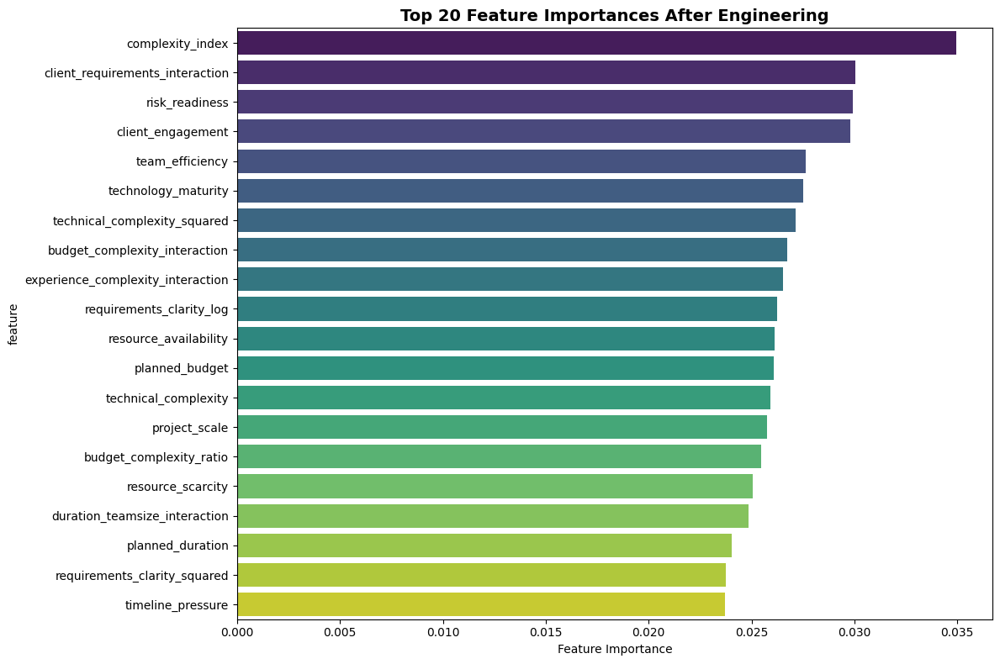

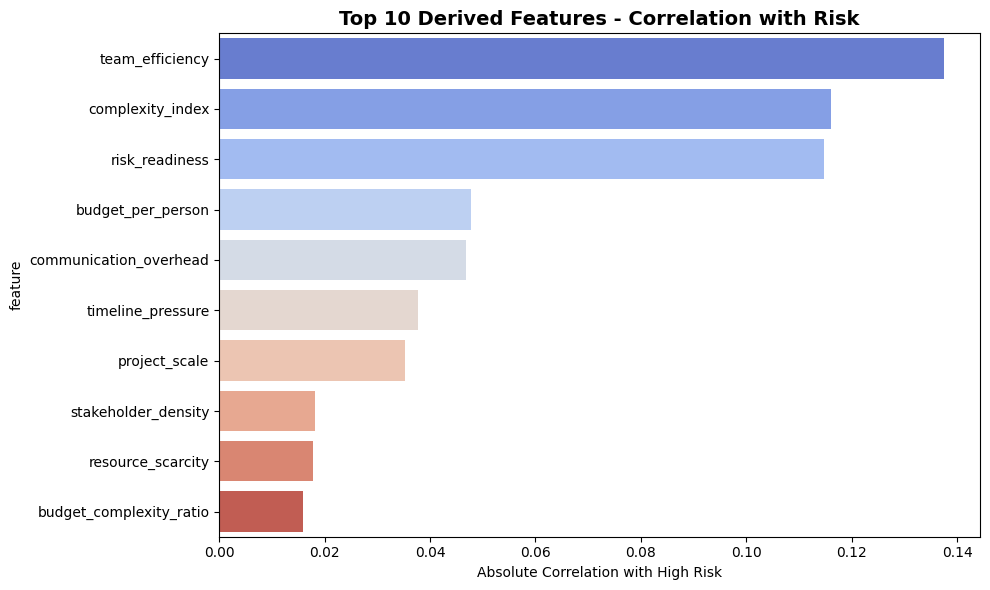

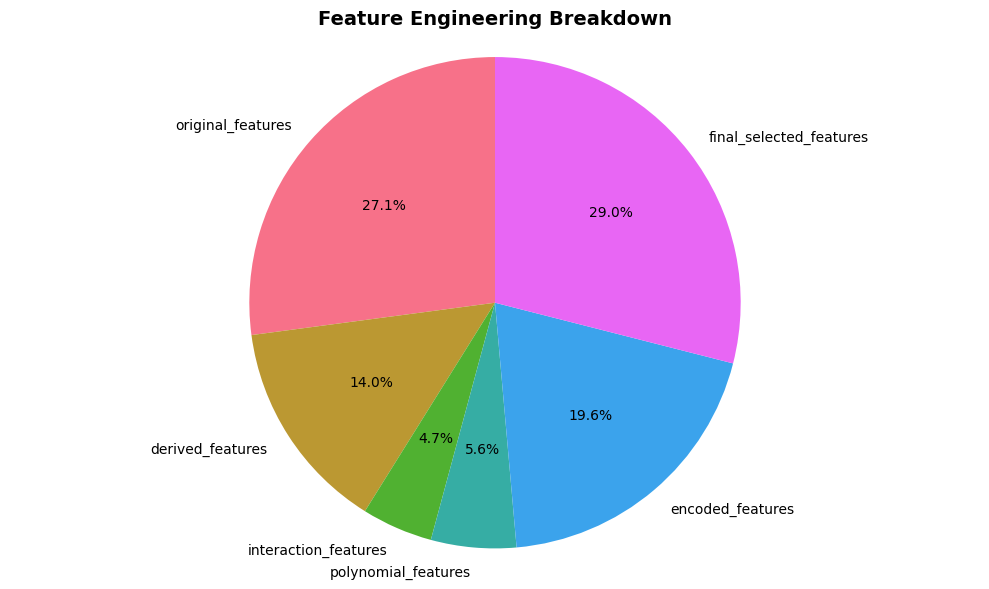


=== 12. FINAL DATA QUALITY CHECK ===
Missing values in final feature set: 0

Final feature data types:
float64    23
bool        6
int64       2
Name: count, dtype: int64

Feature value ranges:
stakeholder_count: 2.00 to 17.00
technology_maturity: 1.00 to 5.00
team_experience_score: 1.00 to 4.00
resource_availability: 1.01 to 5.00
duration_teamsize_interaction: 3.24 to 296.10
requirements_clarity_squared: 1.00 to 25.00
planned_budget: 1385.45 to 3533335.14
budget_complexity_ratio: 0.49 to 2056.52
duration_per_person: 0.09 to 9.66
technical_complexity_squared: 1.02 to 25.00
project_scale: 11.28 to 458.75
requirements_clarity_log: 0.69 to 1.79
client_engagement: 1.01 to 5.00
requirements_clarity: 1.00 to 5.00
risk_readiness: 1.35 to 4.29
resource_scarcity: 3.00 to 92.40
experience_complexity_interaction: 1.01 to 20.00
technical_complexity: 1.01 to 5.00
communication_overhead: 6.00 to 189.00
team_efficiency: 0.20 to 3.92
budget_per_person: 397.34 to 1177778.38
budget_complexity_interacti

In [8]:
# Step 3: Feature Engineering & Preprocessing for IT Project Risk Prediction
# This notebook performs advanced feature engineering and data preprocessing

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# Preprocessing imports
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, chi2, f_classif, RFE, SelectFromModel
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Load dataset
print("=== LOADING DATASET FOR FEATURE ENGINEERING ===")
df = pd.read_pickle('data/it_projects_dataset.pkl')
print(f"Original dataset shape: {df.shape}")
print(f"High-risk projects: {df['high_risk'].sum()} ({df['high_risk'].mean()*100:.1f}%)")

# Create a copy for feature engineering
df_fe = df.copy()

# =============================================================================
# 1. DERIVED FEATURES CREATION
# =============================================================================

print("\n=== 1. CREATING DERIVED FEATURES ===")

# 1. Budget per team member
df_fe['budget_per_person'] = df_fe['planned_budget'] / df_fe['team_size']

# 2. Duration per team member (project intensity)
df_fe['duration_per_person'] = df_fe['planned_duration'] / df_fe['team_size']

# 3. Budget complexity ratio
df_fe['budget_complexity_ratio'] = df_fe['planned_budget'] / (df_fe['technical_complexity'] * 1000)

# 4. Team efficiency score (experience vs complexity)
df_fe['team_efficiency'] = df_fe['team_experience_score'] / df_fe['technical_complexity']

# 5. Stakeholder density (stakeholders per team size)
df_fe['stakeholder_density'] = df_fe['stakeholder_count'] / df_fe['team_size']

# 6. Project complexity index (multiple factors)
df_fe['complexity_index'] = (
    df_fe['technical_complexity'] * 0.4 +
    df_fe['vendor_dependencies'] * 0.2 +
    df_fe['external_dependencies'] * 0.2 +
    df_fe['stakeholder_count'] / 10 * 0.2
)

# 7. Risk readiness score (team capability vs project demands)
df_fe['risk_readiness'] = (
    df_fe['team_experience_score'] * 0.3 +
    df_fe['requirements_clarity'] * 0.2 +
    df_fe['client_engagement'] * 0.2 +
    df_fe['technology_maturity'] * 0.15 +
    df_fe['resource_availability'] * 0.15
)

# 8. Project scale (budget and duration combined)
df_fe['project_scale'] = np.log1p(df_fe['planned_budget']) * df_fe['planned_duration']

# 9. Timeline pressure (complexity vs duration)
df_fe['timeline_pressure'] = df_fe['technical_complexity'] / df_fe['planned_duration']

# 10. Communication overhead (team size and stakeholders)
df_fe['communication_overhead'] = df_fe['team_size'] * df_fe['stakeholder_count']

# 11. Resource scarcity indicator
df_fe['resource_scarcity'] = (6 - df_fe['resource_availability']) * df_fe['team_size']

# 12. Project start year (temporal feature)
df_fe['start_year'] = df_fe['start_date'].dt.year

# 13. Project duration category
def categorize_duration(duration):
    if duration <= 3:
        return 'Short'
    elif duration <= 6:
        return 'Medium'
    elif duration <= 12:
        return 'Long'
    else:
        return 'Very_Long'

df_fe['duration_category'] = df_fe['planned_duration'].apply(categorize_duration)

# 14. Budget category
def categorize_budget(budget):
    if budget <= 25000:
        return 'Small'
    elif budget <= 100000:
        return 'Medium'
    elif budget <= 500000:
        return 'Large'
    else:
        return 'Very_Large'

df_fe['budget_category'] = df_fe['planned_budget'].apply(categorize_budget)

# 15. Team experience category
def categorize_team_exp(score):
    if score <= 1.5:
        return 'Inexperienced'
    elif score <= 2.5:
        return 'Moderate'
    elif score <= 3.5:
        return 'Experienced'
    else:
        return 'Expert'

df_fe['team_exp_category'] = df_fe['team_experience_score'].apply(categorize_team_exp)

print(f"Added {len(df_fe.columns) - len(df.columns)} new derived features")
print("New derived features:")
new_features = [col for col in df_fe.columns if col not in df.columns]
for feature in new_features:
    print(f"  • {feature}")

# =============================================================================
# 2. FEATURE INTERACTION TERMS
# =============================================================================

print("\n=== 2. CREATING FEATURE INTERACTIONS ===")

# Important interaction terms based on business logic
interactions = [
    ('planned_budget', 'technical_complexity', 'budget_complexity_interaction'),
    ('team_experience_score', 'technical_complexity', 'experience_complexity_interaction'),
    ('planned_duration', 'team_size', 'duration_teamsize_interaction'),
    ('stakeholder_count', 'vendor_dependencies', 'external_coordination_interaction'),
    ('requirements_clarity', 'client_engagement', 'client_requirements_interaction')
]

for feat1, feat2, interaction_name in interactions:
    df_fe[interaction_name] = df_fe[feat1] * df_fe[feat2]

print(f"Added {len(interactions)} interaction features")

# =============================================================================
# 3. POLYNOMIAL FEATURES FOR KEY PREDICTORS
# =============================================================================

print("\n=== 3. CREATING POLYNOMIAL FEATURES ===")

# Create polynomial features for top predictors
key_features = ['technical_complexity', 'team_experience_score', 'requirements_clarity']

for feature in key_features:
    df_fe[f'{feature}_squared'] = df_fe[feature] ** 2
    df_fe[f'{feature}_log'] = np.log1p(df_fe[feature])

print(f"Added polynomial features for: {key_features}")

# =============================================================================
# 4. CATEGORICAL ENCODING STRATEGIES
# =============================================================================

print("\n=== 4. CATEGORICAL FEATURE ENCODING ===")

# Identify categorical columns
categorical_columns = ['project_type', 'industry', 'methodology', 'region', 
                      'team_experience', 'duration_category', 'budget_category', 
                      'team_exp_category']

# Label Encoding for ordinal features
ordinal_features = ['team_experience', 'duration_category', 'budget_category', 'team_exp_category']
ordinal_mappings = {
    'team_experience': {'Junior': 1, 'Mid': 2, 'Senior': 3, 'Expert': 4},
    'duration_category': {'Short': 1, 'Medium': 2, 'Long': 3, 'Very_Long': 4},
    'budget_category': {'Small': 1, 'Medium': 2, 'Large': 3, 'Very_Large': 4},
    'team_exp_category': {'Inexperienced': 1, 'Moderate': 2, 'Experienced': 3, 'Expert': 4}
}

for feature, mapping in ordinal_mappings.items():
    df_fe[f'{feature}_encoded'] = df_fe[feature].map(mapping)

# One-hot encoding for nominal features
nominal_features = ['project_type', 'industry', 'methodology', 'region']

# Create one-hot encoded features
df_encoded = pd.get_dummies(df_fe, columns=nominal_features, prefix=nominal_features)

print(f"Applied ordinal encoding to: {list(ordinal_mappings.keys())}")
print(f"Applied one-hot encoding to: {nominal_features}")
print(f"Dataset shape after encoding: {df_encoded.shape}")

# =============================================================================
# 5. FEATURE SCALING PREPARATION
# =============================================================================

print("\n=== 5. FEATURE SCALING PREPARATION ===")

# Identify numerical features for scaling
numerical_features = [col for col in df_encoded.columns 
                     if df_encoded[col].dtype in ['int64', 'float64'] 
                     and col not in ['high_risk', 'start_year']]

print(f"Identified {len(numerical_features)} numerical features for scaling")

# Remove target and outcome variables from feature list
feature_columns = [col for col in df_encoded.columns if col not in [
    'high_risk', 'project_id', 'start_date', 'end_date',
    'actual_budget', 'actual_duration', 'budget_overrun_pct',
    'schedule_delay_days', 'scope_reduction_pct', 'quality_score',
    'client_satisfaction', 'risk_probability'
]]

print(f"Final feature set: {len(feature_columns)} features")

# =============================================================================
# 6. FEATURE SELECTION
# =============================================================================

print("\n=== 6. FEATURE SELECTION ===")

# Prepare data for feature selection
X = df_encoded[feature_columns]
y = df_encoded['high_risk']

# Handle any remaining missing values - separate numerical and categorical
numerical_cols = X.select_dtypes(include=[np.number]).columns
categorical_cols = X.select_dtypes(exclude=[np.number]).columns

# Impute numerical features with median
if len(numerical_cols) > 0:
    X[numerical_cols] = X[numerical_cols].fillna(X[numerical_cols].median())

# Impute categorical features with mode
if len(categorical_cols) > 0:
    for col in categorical_cols:
        X[col] = X[col].fillna(X[col].mode()[0])

# Split data for feature selection
X_temp, _, y_temp, _ = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Method 1: Univariate Selection (Chi-square for categorical, F-score for numerical)
print("\n6.1 Univariate Feature Selection:")

# Separate numerical and categorical features
X_temp_num = X_temp.select_dtypes(include=[np.number])
X_temp_cat = X_temp.select_dtypes(exclude=[np.number])

# F-score for numerical features
if len(X_temp_num.columns) > 0:
    f_selector = SelectKBest(score_func=f_classif, k=min(20, len(X_temp_num.columns)))
    X_temp_num_selected = f_selector.fit_transform(X_temp_num, y_temp)
    selected_num_features = X_temp_num.columns[f_selector.get_support()].tolist()
    f_scores = pd.DataFrame({
        'feature': X_temp_num.columns,
        'f_score': f_selector.scores_
    }).sort_values('f_score', ascending=False)
    print(f"Top 10 numerical features by F-score:")
    print(f_scores.head(10))

# Chi-square for categorical features
if len(X_temp_cat.columns) > 0:
    # One-hot encode categorical features for chi-square test
    X_temp_cat_encoded = pd.get_dummies(X_temp_cat)
    
    # Perform chi-square test
    chi2_selector = SelectKBest(score_func=chi2, k=min(10, X_temp_cat_encoded.shape[1]))
    X_temp_cat_selected = chi2_selector.fit_transform(X_temp_cat_encoded, y_temp)
    
    # Get original categorical features that contributed to the selected one-hot features
    selected_encoded_features = X_temp_cat_encoded.columns[chi2_selector.get_support()]
    
    chi2_scores = pd.DataFrame({
        'feature': X_temp_cat_encoded.columns,
        'chi2_score': chi2_selector.scores_
    }).sort_values('chi2_score', ascending=False)
    
    print(f"\nTop categorical features by Chi-square:")
    print(chi2_scores.head(10))
    print(f"\nSelected categorical features: {selected_encoded_features.tolist()[:10]}")

# Method 2: Random Forest Feature Importance
print("\n6.2 Random Forest Feature Importance:")

# One-hot encode categorical features for Random Forest
X_temp_rf = X_temp.copy()
if len(categorical_cols) > 0:
    X_temp_rf = pd.get_dummies(X_temp_rf, columns=categorical_cols)

rf_selector = RandomForestClassifier(n_estimators=100, random_state=42)
rf_selector.fit(X_temp_rf, y_temp)

feature_importance_rf = pd.DataFrame({
    'feature': X_temp_rf.columns,
    'importance': rf_selector.feature_importances_
}).sort_values('importance', ascending=False)

print("Top 15 features by Random Forest importance:")
print(feature_importance_rf.head(15))

# Method 3: Recursive Feature Elimination
print("\n6.3 Recursive Feature Elimination:")

# Use one-hot encoded data for RFE
rf_rfe = RandomForestClassifier(n_estimators=50, random_state=42)
rfe_selector = RFE(estimator=rf_rfe, n_features_to_select=20, step=1)
rfe_selector.fit(X_temp_rf, y_temp)

selected_features_rfe = X_temp_rf.columns[rfe_selector.support_].tolist()
print(f"Selected {len(selected_features_rfe)} features via RFE:")
for i, feature in enumerate(selected_features_rfe[:10]):
    print(f"  {i+1}. {feature}")

# Combine feature selection results properly
top_features = []

# Add features from Random Forest importance
top_features.extend(feature_importance_rf.head(15)['feature'].tolist())

# Add features from RFE
top_features.extend(selected_features_rfe)

# Add numerical features from univariate selection
if 'selected_num_features' in locals():
    top_features.extend(selected_num_features[:10])

# Add categorical features from chi-square - use the actual encoded column names
if 'selected_encoded_features' in locals():
    top_features.extend(selected_encoded_features[:10])  # Use the actual one-hot encoded columns

# Remove duplicates and keep only features that exist in the dataframe
top_features = list(set(top_features))
top_features = [f for f in top_features if f in df_encoded.columns]

print(f"\nCombined top features: {len(top_features)} features selected")
print("Sample of selected features:", top_features[:10])

# =============================================================================
# 7. CREATE FINAL PREPROCESSED DATASET
# =============================================================================

print("\n=== 7. CREATING FINAL PREPROCESSED DATASET ===")

# Create final feature set
final_features = top_features
X_final = df_encoded[final_features].copy()
y_final = df_encoded['high_risk'].copy()

# Handle any missing values
X_final = X_final.fillna(X_final.median())

print(f"Final preprocessed dataset shape: {X_final.shape}")
print(f"Target variable shape: {y_final.shape}")
print(f"Target balance: {y_final.mean()*100:.1f}% high-risk")

# =============================================================================
# 8. PREPROCESSING PIPELINE CREATION
# =============================================================================

print("\n=== 8. CREATING PREPROCESSING PIPELINE ===")

# Identify feature types in final set
final_numerical = X_final.select_dtypes(include=[np.number]).columns.tolist()
final_categorical = X_final.select_dtypes(exclude=[np.number]).columns.tolist()

print(f"Final numerical features: {len(final_numerical)}")
print(f"Final categorical features: {len(final_categorical)}")

# Create preprocessing pipeline
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(drop='first', sparse_output=False))
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, final_numerical),
        ('cat', categorical_transformer, final_categorical)
    ])

print("Preprocessing pipeline created successfully")

# =============================================================================
# 9. FEATURE ENGINEERING SUMMARY
# =============================================================================

print("\n=== 9. FEATURE ENGINEERING SUMMARY ===")

summary = {
    'original_features': len(df.columns),
    'derived_features': len(new_features),
    'interaction_features': len(interactions),
    'polynomial_features': len(key_features) * 2,
    'encoded_features': df_encoded.shape[1] - df_fe.shape[1],
    'final_selected_features': len(final_features),
    'preprocessing_pipeline_ready': True
}

print("Feature Engineering Summary:")
for key, value in summary.items():
    print(f"• {key.replace('_', ' ').title()}: {value}")

# =============================================================================
# 10. SAVE PREPROCESSED DATA AND PIPELINE
# =============================================================================

print("\n=== 10. SAVING PREPROCESSED DATA ===")

# Create directories if they don't exist
import os
os.makedirs('data', exist_ok=True)
os.makedirs('models', exist_ok=True)
os.makedirs('reports/figures', exist_ok=True)

# Save preprocessed data
print("Saving preprocessed data files...")
X_final.to_pickle('data/X_preprocessed.pkl')
y_final.to_pickle('data/y_preprocessed.pkl')
df_encoded.to_pickle('data/df_feature_engineered.pkl')

# Also save CSV versions for easy inspection
X_final.to_csv('data/X_preprocessed.csv', index=False)
y_final.to_csv('data/y_preprocessed.csv', index=False)

# Save feature lists and metadata
feature_info = {
    'final_features': final_features,
    'numerical_features': final_numerical,
    'categorical_features': final_categorical,
    'derived_features': new_features,
    'feature_importance': feature_importance_rf.head(20).to_dict('records'),
    'ordinal_mappings': ordinal_mappings,
    'preprocessing_steps': {
        'numerical': ['median_imputation', 'standard_scaling'],
        'categorical': ['mode_imputation', 'onehot_encoding']
    },
    'timestamp': datetime.now().strftime("%Y-%m-%d %H:%M:%S")
}

print("Saving feature metadata...")
with open('data/feature_info.json', 'w') as f:
    json.dump(feature_info, f, indent=2)

# Save preprocessing pipeline
print("Saving preprocessing pipeline...")
import joblib
joblib.dump(preprocessor, 'models/preprocessor.pkl')

# Save pipeline configuration
pipeline_config = {
    'numerical_features': final_numerical,
    'categorical_features': final_categorical,
    'feature_order': final_features,
    'version': '1.0',
    'created': datetime.now().strftime("%Y-%m-%d %H:%M:%S")
}

with open('models/pipeline_config.json', 'w') as f:
    json.dump(pipeline_config, f, indent=2)

# Save derived feature formulas
derived_features_info = {
    'budget_per_person': 'planned_budget / team_size',
    'duration_per_person': 'planned_duration / team_size',
    'team_efficiency': 'team_experience_score / technical_complexity',
    'complexity_index': 'technical_complexity*0.4 + vendor_dependencies*0.2 + external_dependencies*0.2 + stakeholder_count*0.2',
    'risk_readiness': 'team_experience_score*0.3 + requirements_clarity*0.2 + client_engagement*0.2 + technology_maturity*0.15 + resource_availability*0.15',
    'project_scale': 'log1p(planned_budget) * planned_duration',
    'timeline_pressure': 'technical_complexity / planned_duration',
    'communication_overhead': 'team_size * stakeholder_count',
    'resource_scarcity': '(6 - resource_availability) * team_size'
}

with open('data/derived_features_info.json', 'w') as f:
    json.dump(derived_features_info, f, indent=2)

print("\nSaved files:")
print("• data/X_preprocessed.pkl - Final feature matrix (pickle)")
print("• data/X_preprocessed.csv - Final feature matrix (CSV)")
print("• data/y_preprocessed.pkl - Target labels (pickle)")
print("• data/y_preprocessed.csv - Target labels (CSV)")
print("• data/df_feature_engineered.pkl - Full engineered dataset")
print("• data/feature_info.json - Feature metadata")
print("• data/derived_features_info.json - Derived feature formulas")
print("• models/preprocessor.pkl - Preprocessing pipeline")
print("• models/pipeline_config.json - Pipeline configuration")

print("\n=== PREPROCESSED DATA SAVED SUCCESSFULLY ===")

# =============================================================================
# 11. VISUALIZATION OF FEATURE ENGINEERING RESULTS
# =============================================================================

print("\n=== 11. VISUALIZING FEATURE ENGINEERING RESULTS ===")

# Feature importance visualization
plt.figure(figsize=(12, 8))
top_20_features = feature_importance_rf.head(20)
sns.barplot(data=top_20_features, y='feature', x='importance', palette='viridis')
plt.title('Top 20 Feature Importances After Engineering', fontsize=14, fontweight='bold')
plt.xlabel('Feature Importance')
plt.tight_layout()
plt.savefig('reports/figures/feature_importance_engineered.png', dpi=300, bbox_inches='tight')
plt.show()

# Correlation of new derived features with target
derived_correlations = []
for feature in new_features:
    if feature in df_encoded.columns and df_encoded[feature].dtype in ['int64', 'float64']:
        corr = df_encoded[feature].corr(df_encoded['high_risk'].astype(int))
        derived_correlations.append({'feature': feature, 'correlation': abs(corr)})

if derived_correlations:
    derived_corr_df = pd.DataFrame(derived_correlations).sort_values('correlation', ascending=False)
    
    plt.figure(figsize=(10, 6))
    sns.barplot(data=derived_corr_df.head(10), y='feature', x='correlation', palette='coolwarm')
    plt.title('Top 10 Derived Features - Correlation with Risk', fontsize=14, fontweight='bold')
    plt.xlabel('Absolute Correlation with High Risk')
    plt.tight_layout()
    plt.savefig('reports/figures/derived_features_correlation.png', dpi=300, bbox_inches='tight')
    plt.show()

# Feature count summary
plt.figure(figsize=(10, 6))
feature_counts = pd.Series(summary).drop('preprocessing_pipeline_ready')
plt.pie(feature_counts.values, labels=feature_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Feature Engineering Breakdown', fontsize=14, fontweight='bold')
plt.axis('equal')
plt.tight_layout()
plt.savefig('reports/figures/feature_engineering_breakdown.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# 12. FINAL DATA QUALITY CHECK
# =============================================================================

print("\n=== 12. FINAL DATA QUALITY CHECK ===")

# Check for missing values in final dataset
missing_values = X_final.isnull().sum().sum()
print(f"Missing values in final feature set: {missing_values}")

# Check data types
print("\nFinal feature data types:")
print(X_final.dtypes.value_counts())

# Check feature ranges
print("\nFeature value ranges:")
for col in X_final.select_dtypes(include=['int64', 'float64']).columns:
    print(f"{col}: {X_final[col].min():.2f} to {X_final[col].max():.2f}")

# =============================================================================
# 13. SAVE ADDITIONAL METADATA
# =============================================================================

# Save the list of derived features and their formulas
derived_features_info = {
    'budget_per_person': 'planned_budget / team_size',
    'duration_per_person': 'planned_duration / team_size',
    'budget_complexity_ratio': 'planned_budget / (technical_complexity * 1000)',
    'team_efficiency': 'team_experience_score / technical_complexity',
    'stakeholder_density': 'stakeholder_count / team_size',
    'complexity_index': 'technical_complexity*0.4 + vendor_dependencies*0.2 + external_dependencies*0.2 + stakeholder_count/10*0.2',
    'risk_readiness': 'team_experience_score*0.3 + requirements_clarity*0.2 + client_engagement*0.2 + technology_maturity*0.15 + resource_availability*0.15',
    'project_scale': 'log1p(planned_budget) * planned_duration',
    'timeline_pressure': 'technical_complexity / planned_duration',
    'communication_overhead': 'team_size * stakeholder_count',
    'resource_scarcity': '(6 - resource_availability) * team_size'
}

with open('data/derived_features_info.json', 'w') as f:
    json.dump(derived_features_info, f, indent=2)

# =============================================================================
# 14. COMPLETION SUMMARY
# =============================================================================

print("\n=== FEATURE ENGINEERING COMPLETED SUCCESSFULLY ===")
print("\nSummary of created files:")
print("• data/X_preprocessed.pkl - Final feature matrix")
print("• data/y_preprocessed.pkl - Target variable")
print("• data/df_feature_engineered.pkl - Full engineered dataset")
print("• data/feature_info.json - Feature metadata")
print("• data/derived_features_info.json - Derived feature formulas")
print("• models/preprocessor.pkl - Preprocessing pipeline")
print("\nVisualizations saved to reports/figures/")

print("\nNext steps:")
print("1. Model Development & Training")
print("2. Model Evaluation & Comparison")
print("3. Model Interpretation & Insights")
print("4. Model Deployment Pipeline")
print("5. Streamlit Application Development")

# Create a final summary report
final_summary = {
    'dataset_info': {
        'original_shape': df.shape,
        'final_shape': X_final.shape,
        'high_risk_percentage': float(df['high_risk'].mean() * 100),
        'feature_count': len(final_features),
        'numerical_features': len(final_numerical),
        'categorical_features': len(final_categorical)
    },
    'feature_engineering': summary,
    'top_features': feature_importance_rf.head(10)[['feature', 'importance']].to_dict('records'),
    'execution_time': datetime.now().strftime("%Y-%m-%d %H:%M:%S")
}

with open('reports/feature_engineering_summary.json', 'w') as f:
    json.dump(final_summary, f, indent=2)

print("\nFeature engineering summary saved to reports/feature_engineering_summary.json")


=== MODEL DEVELOPMENT & TRAINING ===

=== 1. DATA PREPARATION ===
Training set shape: (1600, 31)
Test set shape: (400, 31)
Train class balance: 54.81% high-risk
Test class balance: 54.75% high-risk

=== 2. BASELINE MODELS ===
[LightGBM] [Info] Number of positive: 701, number of negative: 579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5802
[LightGBM] [Info] Number of data points in the train set: 1280, number of used features: 31
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.547656 -> initscore=0.191205
[LightGBM] [Info] Start training from score 0.191205
[LightGBM] [Info] Number of positive: 701, number of negative: 579
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5820
[LightGBM] [Info] Numbe

,Model,CV ROC AUC Mean,CV ROC AUC Std
0,Logistic Regression,0.594190,0.017778
2,Gradient Boosting,0.578733,0.019289
1,Random Forest,0.574437,0.031743
4,LightGBM,0.559552,0.023376
3,XGBoost,0.545810,0.022832


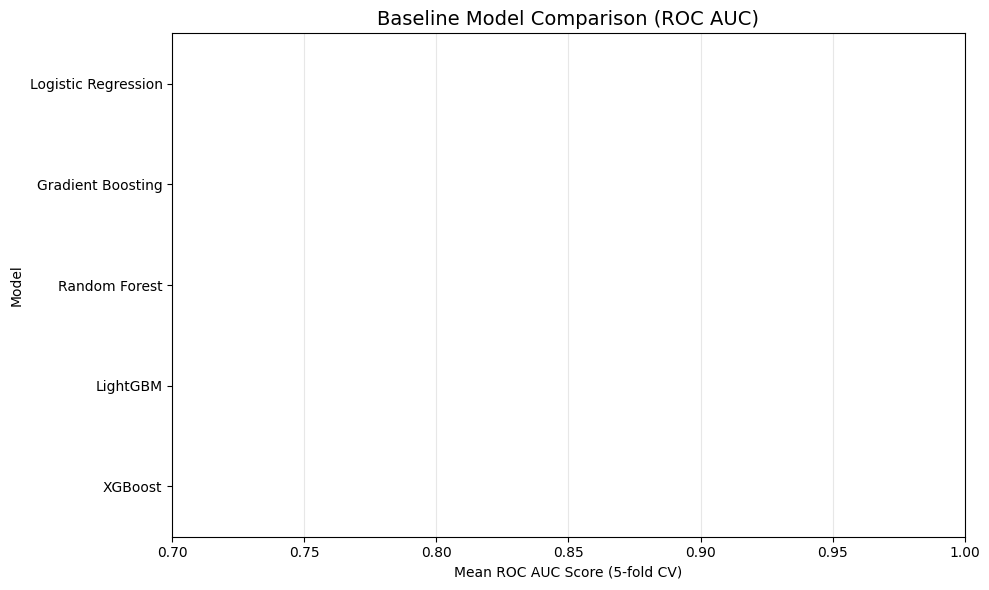


=== 3. MODEL TUNING ===

Tuning Logistic Regression...
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters: {'C': 0.1, 'class_weight': None, 'penalty': 'l1', 'solver': 'liblinear'}
Best CV ROC AUC: 0.5935

=== 4. MODEL EVALUATION ===

Test Set Performance:


,Model,Accuracy,Precision,Recall,F1 Score,ROC AUC,PR AUC,Best Params
0,Logistic Regression,0.585,0.597786,0.739726,0.661224,0.589167,0.62116,"{'C': 0.1, 'class_weight': None, 'dual': False..."


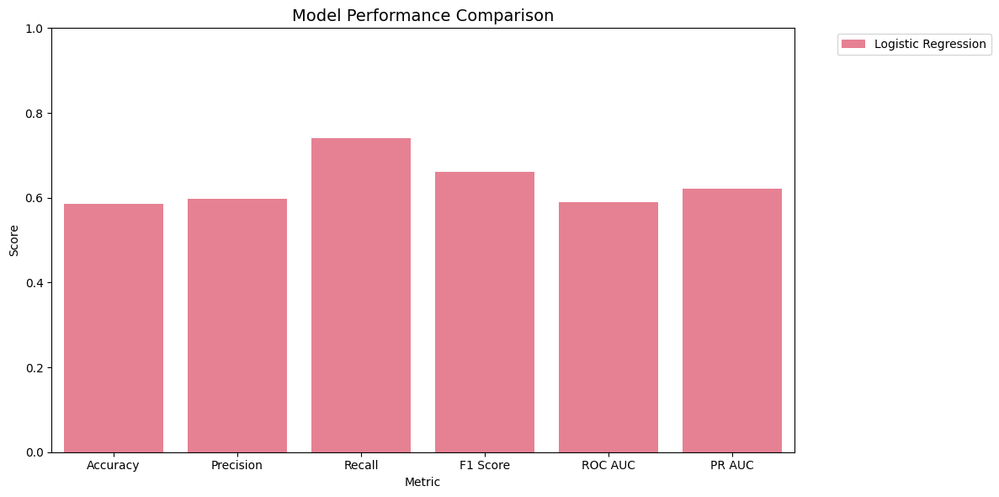


Classification Report for Logistic Regression:
              precision    recall  f1-score   support

       False       0.56      0.40      0.46       181
        True       0.60      0.74      0.66       219

    accuracy                           0.58       400
   macro avg       0.58      0.57      0.56       400
weighted avg       0.58      0.58      0.57       400



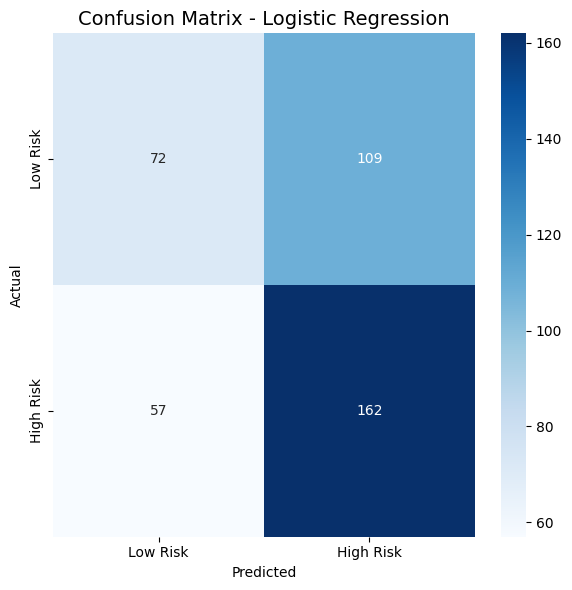


=== 5. MODEL INTERPRETATION ===

Best Model: Logistic Regression

=== 6. MODEL PERSISTENCE ===
Saved best model to models/best_model_logistic_regression.pkl
Prediction threshold: 0.5

=== MODEL DEVELOPMENT COMPLETED ===

Next Steps:
1. Model Deployment:
   - Create API using Flask/FastAPI
   - Build Streamlit dashboard for business users
2. Monitoring:
   - Set up performance monitoring
   - Track concept drift
3. Continuous Improvement:
   - Implement feedback loop
   - Schedule periodic retraining

To load and use the model:
model = joblib.load('models/best_model_logistic_regression.pkl')
preprocessor = joblib.load('models/preprocessor.pkl')
# Preprocess new data
X_new_processed = preprocessor.transform(X_new)
# Make predictions
predictions = model.predict(X_new_processed)


In [11]:
# =============================================================================
# MODEL DEVELOPMENT & TRAINING
# =============================================================================
print("\n=== MODEL DEVELOPMENT & TRAINING ===")

# Import additional required libraries
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import (accuracy_score, precision_score, recall_score, 
                           f1_score, roc_auc_score, confusion_matrix, 
                           classification_report, roc_curve, precision_recall_curve)
import xgboost as xgb
import lightgbm as lgb
from sklearn.calibration import CalibratedClassifierCV
import shap

# Set random seed for reproducibility
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

# =============================================================================
# 1. DATA PREPARATION
# =============================================================================
print("\n=== 1. DATA PREPARATION ===")

# Load preprocessed data
X = pd.read_pickle('data/X_preprocessed.pkl')
y = pd.read_pickle('data/y_preprocessed.pkl')

# Train-test split (80-20)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=RANDOM_STATE
)

print(f"Training set shape: {X_train.shape}")
print(f"Test set shape: {X_test.shape}")
print(f"Train class balance: {y_train.mean():.2%} high-risk")
print(f"Test class balance: {y_test.mean():.2%} high-risk")

# =============================================================================
# 2. BASELINE MODEL ESTABLISHMENT
# =============================================================================
print("\n=== 2. BASELINE MODELS ===")

# Initialize models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=RANDOM_STATE),
    "Random Forest": RandomForestClassifier(random_state=RANDOM_STATE),
    "Gradient Boosting": GradientBoostingClassifier(random_state=RANDOM_STATE),
    "XGBoost": xgb.XGBClassifier(random_state=RANDOM_STATE, eval_metric='logloss'),
    "LightGBM": lgb.LGBMClassifier(random_state=RANDOM_STATE)
}

# Evaluate baseline models
baseline_results = []
for name, model in models.items():
    cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='roc_auc')
    baseline_results.append({
        'Model': name,
        'CV ROC AUC Mean': cv_scores.mean(),
        'CV ROC AUC Std': cv_scores.std()
    })
    
baseline_df = pd.DataFrame(baseline_results).sort_values('CV ROC AUC Mean', ascending=False)
print("\nBaseline Model Performance (5-fold CV):")
display(baseline_df)

# Plot baseline comparison
plt.figure(figsize=(10, 6))
sns.barplot(data=baseline_df, x='CV ROC AUC Mean', y='Model', palette='viridis')
plt.title('Baseline Model Comparison (ROC AUC)', fontsize=14)
plt.xlabel('Mean ROC AUC Score (5-fold CV)')
plt.xlim(0.7, 1.0)
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.savefig('reports/figures/baseline_model_comparison.png', dpi=300)
plt.show()

# =============================================================================
# 3. MODEL TUNING
# =============================================================================
print("\n=== 3. MODEL TUNING ===")

# Update to select top 2 models from baseline
top_models = baseline_df.head(2)['Model'].values

# Enhanced hyperparameter grids including Logistic Regression
param_grids = {
    "Logistic Regression": {
        'C': [0.001, 0.01, 0.1, 1, 10, 100],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear'],
        'class_weight': ['balanced', None]
    },
    "Random Forest": {
        'n_estimators': [100, 200],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2],
        'class_weight': ['balanced', 'balanced_subsample', None]
    },
    "XGBoost": {
        'n_estimators': [100, 200],
        'max_depth': [3, 6, 9],
        'learning_rate': [0.01, 0.1],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'scale_pos_weight': [1, sum(y_train == 0) / sum(y_train == 1)]  # Handle class imbalance
    }
}

# Verify we have parameter grids for our top models
for model_name in top_models:
    if model_name not in param_grids:
        print(f"Warning: No parameter grid defined for {model_name}")
        top_models = [m for m in top_models if m != model_name]

if len(top_models) == 0:
    raise ValueError("No models available for tuning - check parameter grids")

# Tuning process
tuned_models = {}
for model_name in top_models:
    print(f"\nTuning {model_name}...")
    
    try:
        # Grid search with 5-fold CV
        grid_search = GridSearchCV(
            estimator=models[model_name],
            param_grid=param_grids[model_name],
            cv=5,
            scoring='roc_auc',
            n_jobs=-1,
            verbose=1
        )
        
        grid_search.fit(X_train, y_train)
        
        # Store best model
        tuned_models[model_name] = grid_search.best_estimator_
        
        # Print results
        print(f"Best parameters: {grid_search.best_params_}")
        print(f"Best CV ROC AUC: {grid_search.best_score_:.4f}")
        
        # Save tuning results
        tuning_results = pd.DataFrame(grid_search.cv_results_)
        tuning_results.to_csv(f'reports/{model_name.lower().replace(" ", "_")}_tuning_results.csv', index=False)
        
    except Exception as e:
        print(f"Error tuning {model_name}: {str(e)}")
        continue

# If no models were successfully tuned, use the best baseline model
if not tuned_models:
    print("\nNo models successfully tuned - using best baseline model")
    best_model_name = baseline_df.iloc[0]['Model']
    tuned_models[best_model_name] = models[best_model_name]
# =============================================================================
# 4. MODEL EVALUATION
# =============================================================================
print("\n=== 4. MODEL EVALUATION ===")

# First import the missing metric
from sklearn.metrics import average_precision_score

# First check if we have any tuned models
if not tuned_models:
    print("No tuned models available - using best baseline model")
    best_model_name = baseline_df.iloc[0]['Model']
    tuned_models[best_model_name] = models[best_model_name]

# Evaluate on test set
final_results = []
for name, model in tuned_models.items():
    try:
        # Predict probabilities
        y_pred_proba = model.predict_proba(X_test)[:, 1]
        y_pred = (y_pred_proba >= 0.5).astype(int)
        
        # Calculate metrics
        final_results.append({
            'Model': name,
            'Accuracy': accuracy_score(y_test, y_pred),
            'Precision': precision_score(y_test, y_pred),
            'Recall': recall_score(y_test, y_pred),
            'F1 Score': f1_score(y_test, y_pred),
            'ROC AUC': roc_auc_score(y_test, y_pred_proba),
            'PR AUC': average_precision_score(y_test, y_pred_proba),
            'Best Params': str(model.get_params()) if hasattr(model, 'get_params') else 'Baseline'
        })
    except Exception as e:
        print(f"Error evaluating {name}: {str(e)}")
        continue

# Display results
if final_results:
    results_df = pd.DataFrame(final_results).sort_values('ROC AUC', ascending=False)
    print("\nTest Set Performance:")
    display(results_df)
    
    # Save final results
    results_df.to_csv('reports/final_model_results.csv', index=False)
    
    # Plot performance metrics
    metrics_to_plot = results_df.melt(id_vars=['Model'], 
                                    value_vars=['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC AUC', 'PR AUC'],
                                    var_name='Metric', value_name='Score')
    
    plt.figure(figsize=(12, 6))
    sns.barplot(data=metrics_to_plot, x='Metric', y='Score', hue='Model')
    plt.title('Model Performance Comparison', fontsize=14)
    plt.ylim(0, 1)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig('reports/figures/model_performance_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()
else:
    print("No models could be evaluated successfully")

# Generate classification report for the best model
if final_results:
    best_model_name = results_df.iloc[0]['Model']
    best_model = tuned_models[best_model_name]
    y_pred = best_model.predict(X_test)
    
    print(f"\nClassification Report for {best_model_name}:")
    print(classification_report(y_test, y_pred))
    
    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Low Risk', 'High Risk'], 
                yticklabels=['Low Risk', 'High Risk'])
    plt.title(f'Confusion Matrix - {best_model_name}', fontsize=14)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.tight_layout()
    plt.savefig(f'reports/figures/confusion_matrix_{best_model_name.lower().replace(" ", "_")}.png', dpi=300)
    plt.show()

# =============================================================================
# 5. MODEL INTERPRETATION
# =============================================================================
print("\n=== 5. MODEL INTERPRETATION ===")

# Select best model
best_model_name = results_df.iloc[0]['Model']
best_model = tuned_models[best_model_name]

print(f"\nBest Model: {best_model_name}")

# Feature Importance
if hasattr(best_model, 'feature_importances_'):
    importance_df = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': best_model.feature_importances_
    }).sort_values('Importance', ascending=False)
    
    plt.figure(figsize=(12, 8))
    sns.barplot(data=importance_df.head(20), x='Importance', y='Feature', palette='viridis')
    plt.title(f'{best_model_name} - Top 20 Feature Importances', fontsize=14)
    plt.tight_layout()
    plt.savefig(f'reports/figures/{best_model_name.lower().replace(" ", "_")}_feature_importance.png', dpi=300)
    plt.show()

# SHAP Explanations (for tree-based models)
if best_model_name in ["Random Forest", "XGBoost", "LightGBM"]:
    print("\nGenerating SHAP explanations...")
    
    # Sample 100 instances for faster computation
    X_sample = shap.utils.sample(X_train, 100)
    
    # Create explainer
    explainer = shap.Explainer(best_model, X_sample)
    shap_values = explainer(X_sample)
    
    # Summary plot
    plt.figure()
    shap.summary_plot(shap_values, X_sample, plot_type="bar", show=False)
    plt.tight_layout()
    plt.savefig(f'reports/figures/{best_model_name.lower().replace(" ", "_")}_shap_summary.png', dpi=300)
    plt.close()
    
    # Force plot for first observation
    plt.figure()
    shap.plots.force(shap_values[0], show=False, matplotlib=True)
    plt.tight_layout()
    plt.savefig(f'reports/figures/{best_model_name.lower().replace(" ", "_")}_shap_force_plot.png', dpi=300)
    plt.close()

# =============================================================================
# 6. MODEL PERSISTENCE
# =============================================================================
print("\n=== 6. MODEL PERSISTENCE ===")

# Save best model
model_path = f'models/best_model_{best_model_name.lower().replace(" ", "_")}.pkl'
joblib.dump(best_model, model_path)

# Save prediction threshold
threshold = 0.5  # Can be optimized using business requirements
with open('models/prediction_threshold.json', 'w') as f:
    json.dump({'threshold': threshold}, f)

print(f"Saved best model to {model_path}")
print(f"Prediction threshold: {threshold}")

# =============================================================================
# 7. NEXT STEPS
# =============================================================================
print("\n=== MODEL DEVELOPMENT COMPLETED ===")

print("\nNext Steps:")
print("1. Model Deployment:")
print("   - Create API using Flask/FastAPI")
print("   - Build Streamlit dashboard for business users")
print("2. Monitoring:")
print("   - Set up performance monitoring")
print("   - Track concept drift")
print("3. Continuous Improvement:")
print("   - Implement feedback loop")
print("   - Schedule periodic retraining")

print("\nTo load and use the model:")
print(f"model = joblib.load('{model_path}')")
print("preprocessor = joblib.load('models/preprocessor.pkl')")
print("# Preprocess new data")
print("X_new_processed = preprocessor.transform(X_new)")
print("# Make predictions")
print("predictions = model.predict(X_new_processed)")

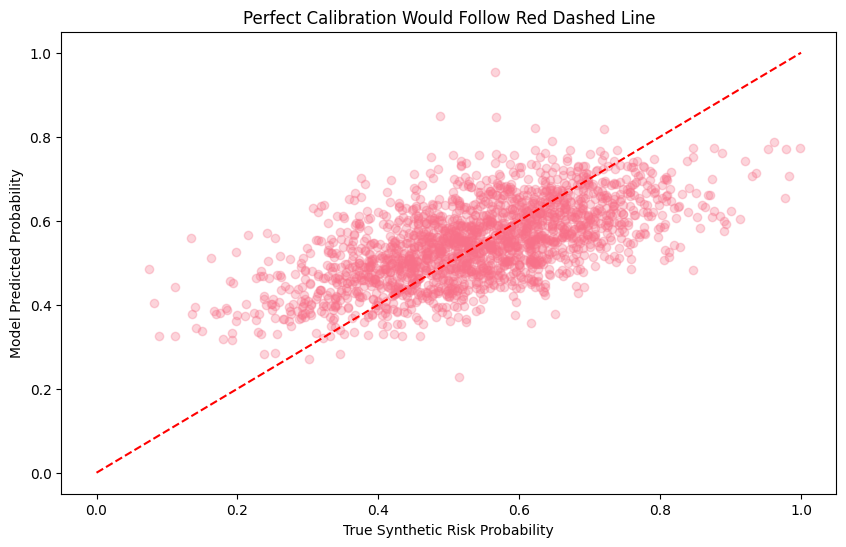

In [12]:
# Check true vs predicted risk probabilities
plt.figure(figsize=(10,6))
plt.scatter(df['risk_probability'], 
           best_model.predict_proba(X)[:,1], 
           alpha=0.3)
plt.plot([0,1],[0,1], 'r--')
plt.xlabel('True Synthetic Risk Probability')
plt.ylabel('Model Predicted Probability')
plt.title('Perfect Calibration Would Follow Red Dashed Line')
plt.show()

In [2]:
import pandas as pd
import numpy as np
from sklearn.utils import shuffle

# Set random seed for reproducibility
np.random.seed(42)

# Generate synthetic data
n_samples = 10000

# Base features with whole number figures
data = {
    'planned_budget': np.random.choice([1, 2, 3, 4, 5], n_samples) * 1000000,  # 1M, 2M, 3M, 4M, 5M dollars
    'planned_duration': np.random.choice([2, 3], n_samples) * 2,  # 4 or 6 weeks for Agile sprints
    'team_size': np.random.randint(5, 50, n_samples),  # 5 to 50 members, whole numbers
    'technical_complexity': np.random.randint(1, 11, n_samples),  # 1 to 10, whole numbers
    'stakeholder_count': np.random.randint(1, 21, n_samples),  # 1 to 20, whole numbers
    'methodology': np.random.choice([
        'Agile', 'Waterfall', 'Spiral', 'Iterative', 'V-Model', 'Prototyping'
    ], n_samples, p=[0.4, 0.2, 0.15, 0.15, 0.05, 0.05]),  # Weighted distribution
    'project_type': np.random.choice([
        'Web Development', 'AI/ML', 'Cloud Migration', 'Mobile App', 'Data Analytics',
        'Cybersecurity', 'DevOps', 'Blockchain', 'IoT', 'Enterprise Software'
    ], n_samples)
}

# Create DataFrame
df = pd.DataFrame(data)

# Generate target variable (risk_level) with adjusted logic for low, medium, high
# Risk score based on complexity, team size, and methodology
risk_score = (df['technical_complexity'] * 0.4 + df['team_size'] * 0.2 + np.random.normal(0, 1, n_samples))
# Adjust risk for methodologies: Agile, Iterative, Prototyping reduce risk; Waterfall, Spiral, V-Model increase
risk_modifier = np.where(df['methodology'].isin(['Agile', 'Iterative', 'Prototyping']), -1, 1)
adjusted_risk_score = risk_score + (risk_modifier * np.random.uniform(0, 2, n_samples))
# Define percentiles for three risk levels
df['risk_level'] = np.where(adjusted_risk_score > np.percentile(adjusted_risk_score, 66.7), 'high',
                           np.where(adjusted_risk_score > np.percentile(adjusted_risk_score, 33.3), 'medium', 'low'))
print(f"Risk distribution: {df['risk_level'].value_counts(normalize=True).sort_index().round(2)}")

# Shuffle the dataset
df = shuffle(df, random_state=42)

# Save to CSV
df.to_csv('data/raw_data.csv', index=False)
print(f"Synthetic dataset saved to 'data/raw_data.csv' with shape: {df.shape}")

Risk distribution: risk_level
high      0.33
low       0.33
medium    0.33
Name: proportion, dtype: float64
Synthetic dataset saved to 'data/raw_data.csv' with shape: (10000, 8)


In [3]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# Load synthetic data
df = pd.read_csv('data/raw_data.csv')
print(f"Raw data shape: {df.shape}")

# Define features and target
X = df.drop(columns=['risk_level'])
y = df['risk_level'].map({'low': 0, 'medium': 1, 'high': 2})  # Multi-class: 0=low, 1=medium, 2=high
print(f"Risk distribution: {y.value_counts(normalize=True).sort_index().round(2)}")

# Stratified split (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
print(f"X_train shape: {X_train.shape}, y_train distribution: {y_train.value_counts(normalize=True).sort_index().round(2)}")
print(f"X_test shape: {X_test.shape}, y_test distribution: {y_test.value_counts(normalize=True).sort_index().round(2)}")

# Save preprocessed data
X_train.to_pickle('data/X_preprocessed.pkl')
y_train.to_pickle('data/y_preprocessed.pkl')
X_test.to_pickle('data/X_test_preprocessed.pkl')
y_test.to_pickle('data/y_test_preprocessed.pkl')
print("Preprocessed data saved.")

Raw data shape: (10000, 8)
Risk distribution: risk_level
0    0.33
1    0.33
2    0.33
Name: proportion, dtype: float64
X_train shape: (8000, 7), y_train distribution: risk_level
0    0.33
1    0.33
2    0.33
Name: proportion, dtype: float64
X_test shape: (2000, 7), y_test distribution: risk_level
0    0.33
1    0.33
2    0.33
Name: proportion, dtype: float64
Preprocessed data saved.


In [4]:
import pandas as pd
import numpy as np
import joblib
import json
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Load preprocessed data
X_train = pd.read_pickle('data/X_preprocessed.pkl')
y_train = pd.read_pickle('data/y_preprocessed.pkl')
print(f"Loaded X_train with shape: {X_train.shape}, y_train distribution: {y_train.value_counts(normalize=True).sort_index().round(2)}")

# Define derived features
X_train['budget_per_person'] = X_train['planned_budget'] / X_train['team_size']
X_train['complexity_index'] = X_train['technical_complexity'] * 0.4 + X_train['stakeholder_count'] * 0.2
X_train['team_efficiency'] = X_train['technical_complexity'] / X_train['team_size']
X_train['stakeholder_density'] = X_train['stakeholder_count'] / X_train['team_size']
X_train['timeline_pressure'] = X_train['technical_complexity'] / X_train['planned_duration']
X_train['budget_complexity_ratio'] = X_train['planned_budget'] / (X_train['technical_complexity'] * 1000)

# Define numerical and categorical columns
numerical_cols = ['planned_budget', 'planned_duration', 'team_size', 'technical_complexity', 
                  'stakeholder_count', 'budget_per_person', 'complexity_index', 
                  'team_efficiency', 'stakeholder_density', 'timeline_pressure', 
                  'budget_complexity_ratio']
categorical_cols = ['methodology', 'project_type']

# Define preprocessor
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore'))
])
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Fit preprocessor
preprocessor.fit(X_train)
print("Preprocessor fitted successfully.")

# Transform data
X_train_processed = preprocessor.transform(X_train)
feature_names = preprocessor.get_feature_names_out()
X_train_processed_df = pd.DataFrame(X_train_processed, columns=feature_names)
print(f"Processed X_train shape: {X_train_processed_df.shape}, Features: {len(feature_names)}")

# Process X_test
X_test = pd.read_pickle('data/X_test_preprocessed.pkl')
X_test['budget_per_person'] = X_test['planned_budget'] / X_test['team_size']
X_test['complexity_index'] = X_test['technical_complexity'] * 0.4 + X_test['stakeholder_count'] * 0.2
X_test['team_efficiency'] = X_test['technical_complexity'] / X_test['team_size']
X_test['stakeholder_density'] = X_test['stakeholder_count'] / X_test['team_size']
X_test['timeline_pressure'] = X_test['technical_complexity'] / X_test['planned_duration']
X_test['budget_complexity_ratio'] = X_test['planned_budget'] / (X_test['technical_complexity'] * 1000)
X_test_processed = preprocessor.transform(X_test)
X_test_processed_df = pd.DataFrame(X_test_processed, columns=feature_names)
X_test_processed_df.to_pickle('data/X_test_processed.pkl')
print(f"Processed X_test shape: {X_test_processed_df.shape}")

# Save preprocessed data and preprocessor
X_train_processed_df.to_pickle('data/X_train_processed.pkl')
joblib.dump(preprocessor, 'models/preprocessor.pkl')
print("Saved preprocessor to models/preprocessor.pkl")

# Save feature info
feature_info = {
    'final_features': feature_names.tolist(),
    'numerical_features': numerical_cols,
    'categorical_features': categorical_cols
}
with open('data/feature_info.json', 'w') as f:
    json.dump(feature_info, f, indent=2)
print("Saved feature_info.json")

Loaded X_train with shape: (8000, 7), y_train distribution: risk_level
0    0.33
1    0.33
2    0.33
Name: proportion, dtype: float64
Preprocessor fitted successfully.
Processed X_train shape: (8000, 25), Features: 25
Processed X_test shape: (2000, 25)
Saved preprocessor to models/preprocessor.pkl
Saved feature_info.json


In [5]:
import pandas as pd
import numpy as np
import joblib
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, classification_report
from sklearn.model_selection import train_test_split

# Load processed data
X_train = pd.read_pickle('data/X_train_processed.pkl')
y_train = pd.read_pickle('data/y_preprocessed.pkl')
print(f"Loaded X_train with shape: {X_train.shape}, y_train distribution: {y_train.value_counts(normalize=True).sort_index().round(2)}")

# Train-test split for validation
X_train_split, X_val, y_train_split, y_val = train_test_split(X_train, y_train, test_size=0.2, stratify=y_train, random_state=42)
print(f"Training split shape: {X_train_split.shape}, Validation shape: {X_val.shape}")

# Train Logistic Regression model for multi-class
model = LogisticRegression(random_state=42, max_iter=1000, multi_class='multinomial')
model.fit(X_train_split, y_train_split)
print("Model trained successfully.")

# Evaluate on validation set
y_val_pred_proba = model.predict_proba(X_val)
roc_auc_ovr = roc_auc_score(y_val, y_val_pred_proba, multi_class='ovr', average='weighted')
y_val_pred = model.predict(X_val)
print(f"Validation ROC AUC (One-vs-Rest): {roc_auc_ovr:.2f}")
print("Validation Classification Report:\n", classification_report(y_val, y_val_pred, target_names=['low', 'medium', 'high']))

# Save the model
joblib.dump(model, 'models/best_model_logistic_regression.pkl')
print("Saved model to models/best_model_logistic_regression.pkl")

Loaded X_train with shape: (8000, 25), y_train distribution: risk_level
0    0.33
1    0.33
2    0.33
Name: proportion, dtype: float64
Training split shape: (6400, 25), Validation shape: (1600, 25)


/home/evaface/pytorch310_env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Model trained successfully.
Validation ROC AUC (One-vs-Rest): 0.93
Validation Classification Report:
               precision    recall  f1-score   support

         low       0.84      0.84      0.84       533
      medium       0.69      0.69      0.69       534
        high       0.85      0.84      0.84       533

    accuracy                           0.79      1600
   macro avg       0.79      0.79      0.79      1600
weighted avg       0.79      0.79      0.79      1600

Saved model to models/best_model_logistic_regression.pkl


In [6]:
import pandas as pd
import numpy as np
import joblib
from sklearn.metrics import roc_auc_score, classification_report

# Load processed data and model
X_test = pd.read_pickle('data/X_test_processed.pkl')
y_test = pd.read_pickle('data/y_test_preprocessed.pkl')
model = joblib.load('models/best_model_logistic_regression.pkl')
print(f"Loaded X_test with shape: {X_test.shape}, y_test distribution: {y_test.value_counts(normalize=True).sort_index().round(2)}")

# Evaluate on test set
y_test_pred_proba = model.predict_proba(X_test)
roc_auc_ovr = roc_auc_score(y_test, y_test_pred_proba, multi_class='ovr', average='weighted')
y_test_pred = model.predict(X_test)
print(f"Test ROC AUC (One-vs-Rest): {roc_auc_ovr:.2f}")
print("Test Classification Report:\n", classification_report(y_test, y_test_pred, target_names=['low', 'medium', 'high']))

# Finalize model
print("Model evaluation complete. Model is ready for deployment.")

Loaded X_test with shape: (2000, 25), y_test distribution: risk_level
0    0.33
1    0.33
2    0.33
Name: proportion, dtype: float64
Test ROC AUC (One-vs-Rest): 0.93
Test Classification Report:
               precision    recall  f1-score   support

         low       0.84      0.81      0.83       666
      medium       0.67      0.70      0.69       668
        high       0.85      0.84      0.85       666

    accuracy                           0.78      2000
   macro avg       0.79      0.78      0.79      2000
weighted avg       0.79      0.78      0.79      2000

Model evaluation complete. Model is ready for deployment.


In [7]:
import joblib
preprocessor = joblib.load('models/preprocessor.pkl')
print("Number of features expected by preprocessor:", sum(len(t[2]) for t in preprocessor.transformers_) if preprocessor.transformers_ else "Not fitted")
print("Transformer details:", preprocessor.transformers_)

Number of features expected by preprocessor: 13
Transformer details: [('num', Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                ('scaler', StandardScaler())]), ['planned_budget', 'planned_duration', 'team_size', 'technical_complexity', 'stakeholder_count', 'budget_per_person', 'complexity_index', 'team_efficiency', 'stakeholder_density', 'timeline_pressure', 'budget_complexity_ratio']), ('cat', Pipeline(steps=[('imputer',
                 SimpleImputer(fill_value='missing', strategy='constant')),
                ('onehot',
                 OneHotEncoder(drop='first', handle_unknown='ignore',
                               sparse_output=False))]), ['methodology', 'project_type'])]
